 ## John D Noble Project 3: ReCell             October 2021

## Business Problem

## Context

Buying and selling used smartphones used to be something that happened on a handful of online marketplace sites. But the used and refurbished phone market has grown considerably over the past decade, and a new IDC (International Data Corporation) forecast predicts that the used phone market would be worth $52.7bn by 2023 with a compound annual growth rate (CAGR) of 13.6% from 2018 to 2023. This growth can be attributed to an uptick in demand for used smartphones that offer considerable savings compared with new models.

Refurbished and used devices continue to provide cost-effective alternatives to both consumers and businesses that are looking to save money when purchasing a smartphone. There are plenty of other benefits associated with the used smartphone market. Used and refurbished devices can be sold with warranties and can also be insured with proof of purchase. Third-party vendors/platforms, such as Verizon, Amazon, etc., provide attractive offers to customers for refurbished smartphones. Maximizing the longevity of mobile phones through second-hand trade also reduces their environmental impact and helps in recycling and reducing waste. The impact of the COVID-19 outbreak may further boost the cheaper refurbished smartphone segment, as consumers cut back on discretionary spending and buy phones only for immediate needs.

IDC (International Data Corporation) forecast predicts that the used phone market would be worth $52.7bn by 2023 with a compound annual growth rate (CAGR) of 13.6% from 2018 to 2023. This growth can be attributed to an uptick in demand for used smartphones that offer considerable savings compared with new models.

## Objective

Build a linear regression model to predict the price of a used phone and identify factors that significantly influence it. 


## Key Questions

- Does used phone price have a positive or negative correlation with the different factors (new prices, memory, size of selfie camera?  
- Can we build a linear model to predict used phone price? If yes, how accurate will the model be?
- What are the predictive variables actually affecting used phone price?

## Data Dictionary

Data Description

The data contains the different attributes of used/refurbished phones. The detailed data dictionary is given below.

Data Dictionary

1.	brand_name: Name of manufacturing brand
2.	os: OS on which the phone runs
3.	screen_size: Size of the screen in cm
4.	4g: Whether 4G is available or not
5.	5g: Whether 5G is available or not
6.	main_camera_mp: Resolution of the rear camera in megapixels
7.	selfie_camera_mp: Resolution of the front camera in megapixels
8.	int_memory: Amount of internal memory (ROM) in GB
9.	ram: Amount of RAM in GB
10.	battery: Energy capacity of the phone battery in mAh
11.	weight: Weight of the phone in grams
12.	release_year: Year when the phone model was released
13.	days_used: Number of days the used/refurbished phone has been used
14.	new_price: Price of a new phone of the same model in euros
15.	used_price: Price of the used/refurbished phone in euros




## Import Basic Libraries

In [1]:
# this will help in making the Python code more structured automatically (good coding practice)
%load_ext nb_black

# Standard Library Imports
from pathlib import Path

# Installed packages
import pandas as pd
from pandas.api.types import is_string_dtype, is_numeric_dtype
pd.set_option("display.precision", 2)

# Removes the limit from the number of displayed columns and rows.
# This is so I can see the entire dataframe when I print it
pd.set_option('display.max_columns', None)
# pd.set_option('display.max_rows', None)

import seaborn as sns
sns.set(color_codes=True) # adds a nice background to the graphs

import matplotlib.pyplot as plt
%matplotlib inline
from ipywidgets import widgets

import numpy as np

# Detailed Profiling Widget
from pandas_profiling import ProfileReport
from pandas_profiling.utils.cache import cache_file

import scipy

# this library contains a large number of probability distributions as well as a growing library of statistical functions
import scipy.stats as stats  

import warnings
warnings.filterwarnings('ignore')

# to split the data into train and test
from sklearn.model_selection import train_test_split

# to build linear regression_model
from sklearn.linear_model import LinearRegression

# to check model performance
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

# to build linear regression_model using statsmodels
import statsmodels.api as sm

# to build linear regression_model using statsmodels
import statsmodels.api as sm


Generating grammar tables from /Users/johnnoble/opt/anaconda3/lib/python3.8/site-packages/blib2to3/Grammar.txt
Writing grammar tables to /Users/johnnoble/Library/Caches/black/19.10b0/Grammar3.8.8.final.0.pickle
Writing failed: [Errno 2] No such file or directory: '/Users/johnnoble/Library/Caches/black/19.10b0/tmpu2ie5soa'
Generating grammar tables from /Users/johnnoble/opt/anaconda3/lib/python3.8/site-packages/blib2to3/PatternGrammar.txt
Writing grammar tables to /Users/johnnoble/Library/Caches/black/19.10b0/PatternGrammar3.8.8.final.0.pickle
Writing failed: [Errno 2] No such file or directory: '/Users/johnnoble/Library/Caches/black/19.10b0/tmprucb65bu'


<IPython.core.display.Javascript object>

## 1 -  Exploratory Data Analysis - Explore & Extract insights from the data.

NOTE: I AM DOING AN INITAL EDA BEFORE ANY DATA TRANSFORMATIONS TO ESTABLISH SOME BASIC RELATIONSHIPS BETWEEN THE INDEPENDENT AND DEPENDENT VARIABLES

In [2]:
# Read in dataset
df = pd.read_csv("used_phone_data.csv")
df.head(5)

,brand_name,os,screen_size,4g,5g,main_camera_mp,selfie_camera_mp,int_memory,ram,battery,weight,release_year,days_used,new_price,used_price
0,Honor,Android,23.97,yes,no,13.0,5.0,64.0,3.0,3020.0,146.0,2020,127,111.62,86.96
1,Honor,Android,28.10,yes,yes,13.0,16.0,128.0,8.0,4300.0,213.0,2020,325,249.39,161.49
2,Honor,Android,24.29,yes,yes,13.0,8.0,128.0,8.0,4200.0,213.0,2020,162,359.47,268.55
3,Honor,Android,26.04,yes,yes,13.0,8.0,64.0,6.0,7250.0,480.0,2020,345,278.93,180.23
4,Honor,Android,15.72,yes,no,13.0,8.0,64.0,3.0,5000.0,185.0,2020,293,140.87,103.80


<IPython.core.display.Javascript object>

In [3]:
# let's create a copy of the data to avoid any changes to original data
df = df.copy()

<IPython.core.display.Javascript object>

In [4]:
df.shape

(3571, 15)

<IPython.core.display.Javascript object>

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3571 entries, 0 to 3570
Data columns (total 15 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   brand_name        3571 non-null   object 
 1   os                3571 non-null   object 
 2   screen_size       3571 non-null   float64
 3   4g                3571 non-null   object 
 4   5g                3571 non-null   object 
 5   main_camera_mp    3391 non-null   float64
 6   selfie_camera_mp  3569 non-null   float64
 7   int_memory        3561 non-null   float64
 8   ram               3561 non-null   float64
 9   battery           3565 non-null   float64
 10  weight            3564 non-null   float64
 11  release_year      3571 non-null   int64  
 12  days_used         3571 non-null   int64  
 13  new_price         3571 non-null   float64
 14  used_price        3571 non-null   float64
dtypes: float64(9), int64(2), object(4)
memory usage: 418.6+ KB


<IPython.core.display.Javascript object>

In [6]:
df.columns

Index(['brand_name', 'os', 'screen_size', '4g', '5g', 'main_camera_mp',
       'selfie_camera_mp', 'int_memory', 'ram', 'battery', 'weight',
       'release_year', 'days_used', 'new_price', 'used_price'],
      dtype='object')

<IPython.core.display.Javascript object>

In [7]:
# Easy way to spot some outliers and probably some errors
df.describe(percentiles=[0.01, 0.25, 0.5, 0.75, 0.99]).apply(
    lambda s: s.apply("{0:.2f}".format)
)

,screen_size,main_camera_mp,selfie_camera_mp,int_memory,ram,battery,weight,release_year,days_used,new_price,used_price
count,3571.00,3391.00,3569.00,3561.00,3561.00,3565.00,3564.00,3571.00,3571.00,3571.00,3571.00
mean,14.80,9.40,6.55,54.53,4.06,3067.23,179.42,2015.96,675.39,237.39,109.88
std,5.15,4.82,6.88,84.70,1.39,1364.21,90.28,2.29,248.64,197.55,121.50
min,2.70,0.08,0.30,0.01,0.03,80.00,23.00,2013.00,91.00,9.13,2.51
1%,3.49,0.30,0.30,4.00,0.25,337.84,48.00,2013.00,131.80,20.46,8.29
25%,12.70,5.00,2.00,16.00,4.00,2100.00,140.00,2014.00,536.00,120.13,45.20
50%,13.49,8.00,5.00,32.00,4.00,3000.00,159.00,2016.00,690.00,189.80,75.53
75%,16.51,13.00,8.00,64.00,4.00,4000.00,184.00,2018.00,872.00,291.94,126.00
99%,28.42,21.02,32.00,512.00,8.00,7812.00,588.70,2020.00,1085.30,949.95,597.18
max,46.36,48.00,32.00,1024.00,16.00,12000.00,950.00,2020.00,1094.00,2560.20,1916.54


<IPython.core.display.Javascript object>

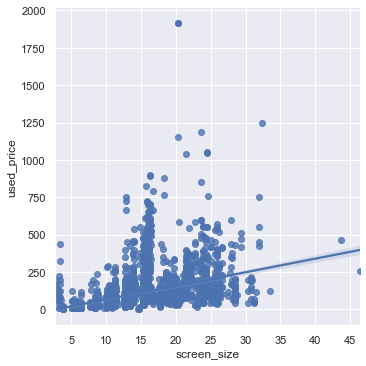

<IPython.core.display.Javascript object>

In [8]:
sns.lmplot(x="screen_size", y="used_price", data=df)

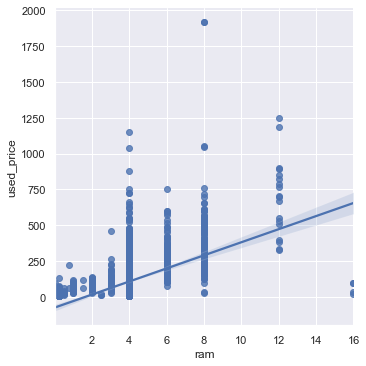

<IPython.core.display.Javascript object>

In [9]:
sns.lmplot(x="ram", y="used_price", data=df)

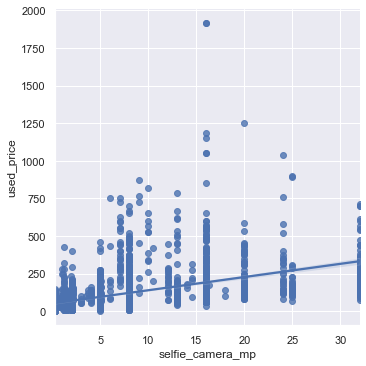

<IPython.core.display.Javascript object>

In [10]:
sns.lmplot(x="selfie_camera_mp", y="used_price", data=df)

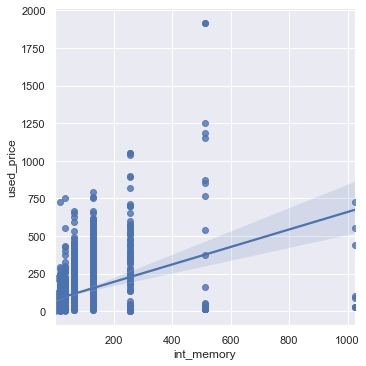

<IPython.core.display.Javascript object>

In [11]:
sns.lmplot(x="int_memory", y="used_price", data=df)

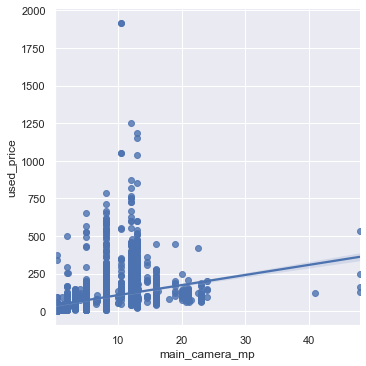

<IPython.core.display.Javascript object>

In [12]:
sns.lmplot(x="main_camera_mp", y="used_price", data=df)

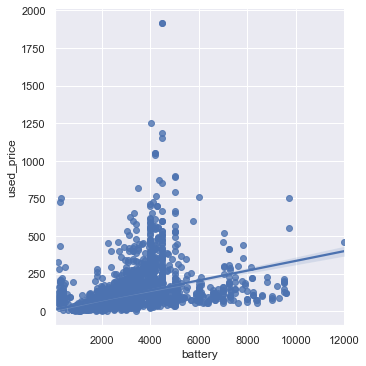

<IPython.core.display.Javascript object>

In [13]:
sns.lmplot(x="battery", y="used_price", data=df)

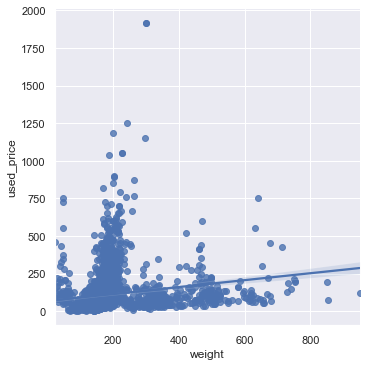

<IPython.core.display.Javascript object>

In [14]:
sns.lmplot(x="weight", y="used_price", data=df)

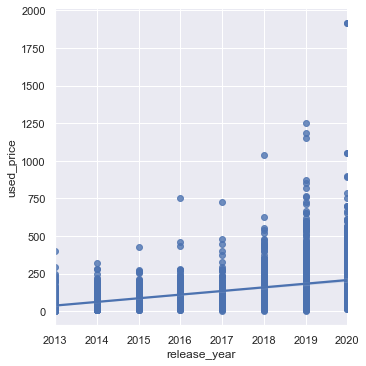

<IPython.core.display.Javascript object>

In [15]:
sns.lmplot(x="release_year", y="used_price", data=df)

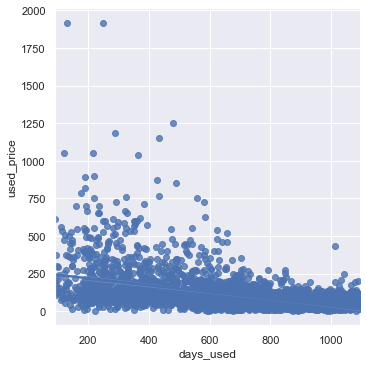

<IPython.core.display.Javascript object>

In [16]:
sns.lmplot(x="days_used", y="used_price", data=df)

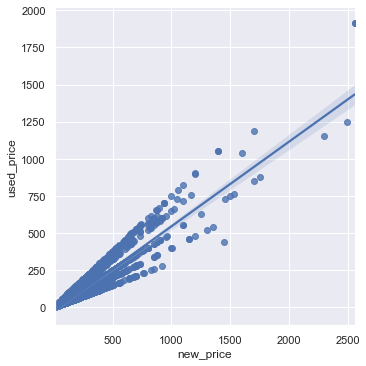

<IPython.core.display.Javascript object>

In [17]:
sns.lmplot(x="new_price", y="used_price", data=df)

NumExpr defaulting to 8 threads.


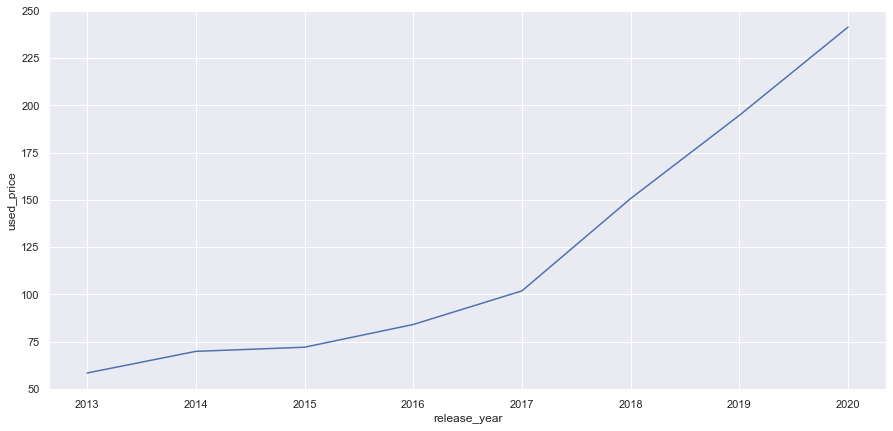

<IPython.core.display.Javascript object>

In [18]:
# average used pricec over the years
plt.figure(figsize=(15, 7))
sns.lineplot(x="release_year", y="used_price", data=df, ci=None)
plt.show()

<div class="alert alert-block alert-info"><b>Insight:</b> 
 

In this scenario 'Used Price' = the dependent variable
    
- Some positive influence on "used price" based on slope of the line (weak) - 'screen_size' 'main_camera_mp','selfie_camera_mp', 'int_memory', 'ram', 'battery', 'weight','release_year', 'new_price',
    
- Some negative influence on "used price" based on slope fo the line - 'days_used"
    

The newer the phone the higher the used prices is and you'd expect the longer a phone is used the less is will command in resale - there is a general downward relationship as youd expect.
    
</div>

# NOTE THE PANDAS PROFILING REPORT DOES NOT RENDER IN THE HTML VERSION OF THIS SUBMISSION

In [19]:
profile = ProfileReport(
    df,
    title="Used Phone Data Pre Data Processing",
    html={"style": {"full_width": True}},
    sort=None,
)
profile.to_widgets()

Summarize dataset:   0%|          | 0/28 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render widgets:   0%|          | 0/1 [00:00<?, ?it/s]

<IPython.core.display.Javascript object>

<div class="alert alert-block alert-info"><b>Insight:</b> 
 
BEFORE data preprocessing this is what we end up with: 
    
    
- Frequent Brand - Samsung 364 , Huawei 264,LG 212, Lenovo172, ZTE 141, Xiaomi 134, Oppo 129, Asus 126, Alcatel 125
- Frequent OS - Android 3246  
- Majority of phones are < 2017  and have 4g, but no 5g
                             
    
Basic Info    
- Number of variables 15
- Number of observations 3571
- Missing cells 215
- Missing cells (%) 0.4%
- Duplicate rows 0
- Duplicate rows (%) 0.0%
- Total size in memory 418.6  KiB
- Average record size in memory 120 B
- Categorical 2
- Numeric 11
- Boolean 2 
                             
                             
Variable Data
- there are 34 unique brands
- there are 4 different OS versions
- years range from 2013 to 2020
- avg screen size is ~15cm
- the avg main camera is ~9MP
- the avg selfie camera is ~6.5MP
- the avg ram is ~4
- avg batterty capacity is ~3067 in mAh
- the avg phone weight is ~179 grams
- the new price range is ~9 to ~2560 (?) ; avg new price is ~237 compared to a used price if ~109
- the used price range is ~2.51 to ~1916; avg used price is ~109
- most of the used phones are 4g, not 5g
    
      
  
</div>

In [20]:
# populate the list of numeric attributes and categorical attributes
num_list = []
cat_list = []

for column in df:
    if is_numeric_dtype(df[column]):
        num_list.append(column)
    elif is_string_dtype(df[column]):
        cat_list.append(column)

print(num_list)
print(cat_list)

['screen_size', 'main_camera_mp', 'selfie_camera_mp', 'int_memory', 'ram', 'battery', 'weight', 'release_year', 'days_used', 'new_price', 'used_price']
['brand_name', 'os', '4g', '5g']


<IPython.core.display.Javascript object>

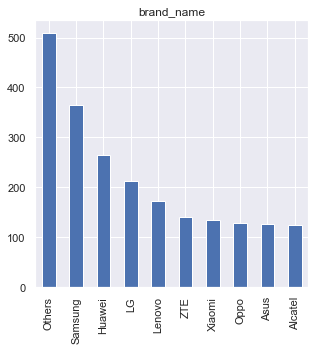

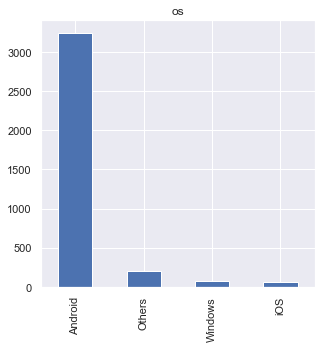

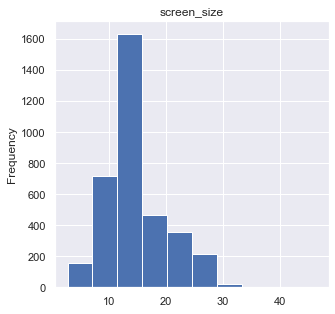

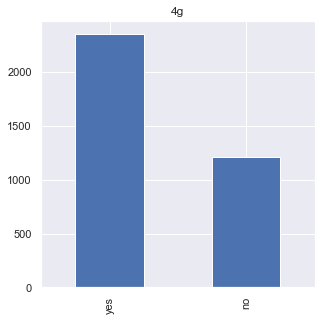

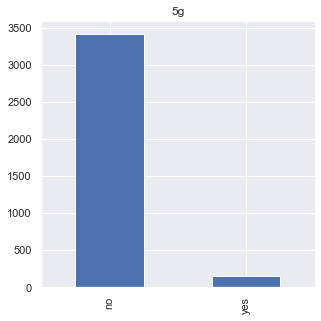

...

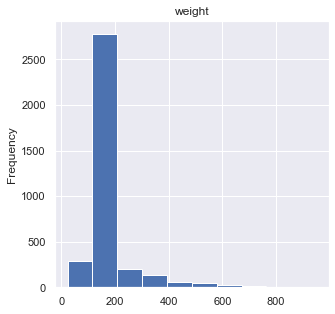

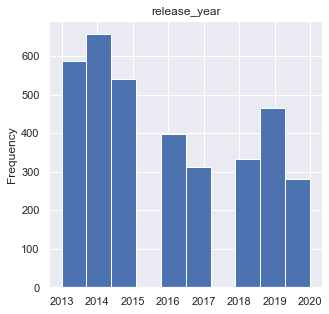

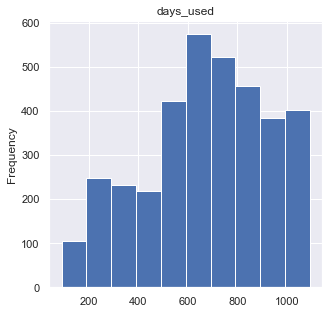

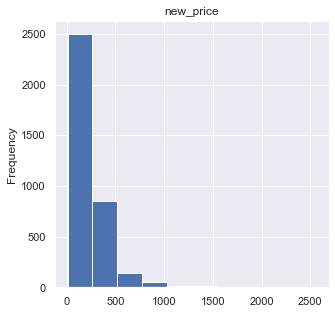

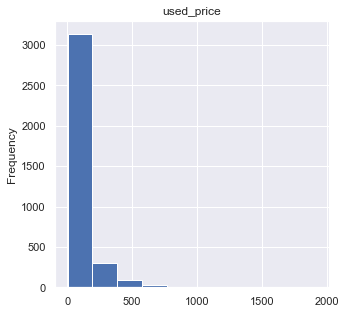

<IPython.core.display.Javascript object>

In [21]:
### 3. Univaraite Analysis ###

# bar chart and histogram
for column in df:
    plt.figure(column, figsize=(4.9, 4.9))
    plt.title(column)
    if is_numeric_dtype(df[column]):
        df[column].plot(kind="hist")
    elif is_string_dtype(df[column]):
        # show only the TOP 10 value count in each categorical data

        df[column].value_counts()[:10].plot(kind="bar")

<AxesSubplot:>

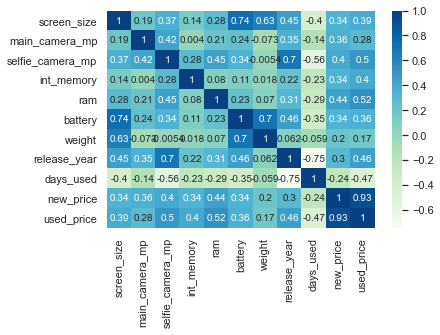

<IPython.core.display.Javascript object>

In [22]:
### 4. Multivariate Analysis ###

# correation matrix and heatmap
correlation = df.corr()
sns.heatmap(correlation, cmap="GnBu", annot=True)

<div class="alert alert-block alert-info"><b>Insight:</b> 

* screen_size is highly correlated with battery and 1 other fields
* selfie_camera_mp is highly correlated with release_year and 1 other fields
* ram is highly correlated with used_price
* battery is highly correlated with screen_size and 1 other fields
* weight is highly correlated with screen_size and 1 other fields
* release_year is highly correlated with selfie_camera_mp and 1 other fields
* days_used is highly correlated with selfie_camera_mp and 1 other fields
* new_price is highly correlated with used_price
* used_price is highly correlated with ram and 1 other fields
* screen_size is highly correlated with selfie_camera_mp and 4 other fields
* main_camera_mp is highly correlated with selfie_camera_mp and 2 other fields
* selfie_camera_mp is highly correlated with screen_size and 7 other fields
* int_memory is highly correlated with selfie_camera_mp and 1 other fields
* battery is highly correlated with screen_size and 4 other fields
* weight is highly correlated with screen_size and 1 other fields
* release_year is highly correlated with screen_size and 5 other fields
* days_used is highly correlated with selfie_camera_mp and 2 other fields
* new_price is highly correlated with main_camera_mp and 2 other fields
* used_price is highly correlated with screen_size and 6 other fields
* screen_size is highly correlated with battery and 1 other fields
* main_camera_mp is highly correlated with selfie_camera_mp
* selfie_camera_mp is highly correlated with main_camera_mp and 1 other fields
* battery is highly correlated with screen_size and 1 other fields
* weight is highly correlated with screen_size and 1 other fields
* release_year is highly correlated with selfie_camera_mp and 1 other fields
* days_used is highly correlated with release_year
* new_price is highly correlated with used_price
* used_price is highly correlated with new_price
* weight is highly correlated with screen_size and 1 other fields
* new_price is highly correlated with used_price
* used_price is highly correlated with new_price and 2 other fields
* selfie_camera_mp is highly correlated with release_year and 3 other fields
* main_camera_mp is highly correlated with brand_name and 1 other fields
* release_year is highly correlated with selfie_camera_mp and 6 other fields
* brand_name is highly correlated with selfie_camera_mp and 8 other fields
* os is highly correlated with brand_name and 2 other fields
* screen_size is highly correlated with weight and 4 other fields
* days_used is highly correlated with release_year and 4 other fields
* 5g is highly correlated with used_price and 3 other fields
* int_memory is highly correlated with brand_name and 3 other fields
* 4g is highly correlated with selfie_camera_mp and 4 other fields
* battery is highly correlated with weight and 7 other fields
* ram is highly correlated with used_price and 5 other fields
* 4g is highly correlated with brand_name
* os is highly correlated with brand_name
* brand_name is highly correlated with 4g and 1 other fields
* main_camera_mp has 180 (5.0%) missing values
    
<div>

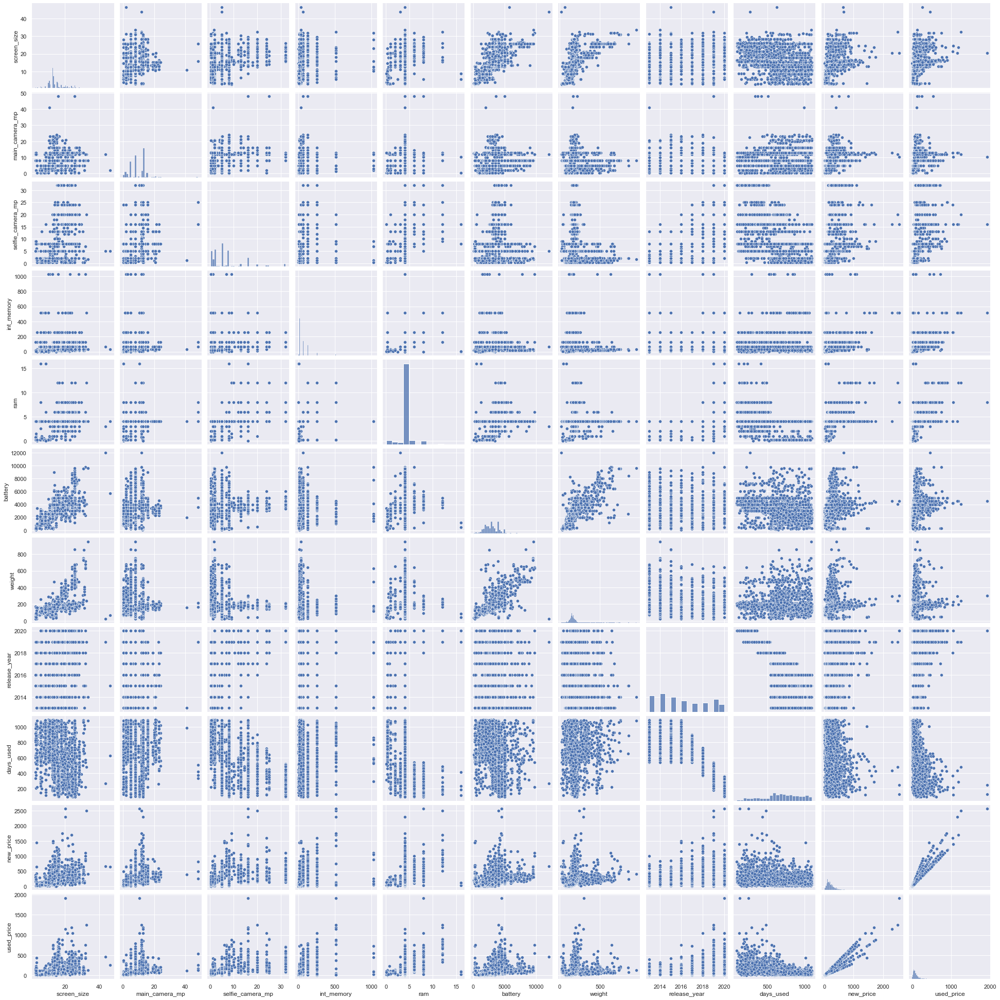

<IPython.core.display.Javascript object>

In [23]:
# pairplot
sns.pairplot(df, height=2.5)

# grouped bar chart
for i in range(0, len(cat_list)):
    primary_cat = cat_list[i]
for j in range(0, len(cat_list)):
    secondary_cat = cat_list[j]
if secondary_cat != primary_cat:
    plt.figure(figsize=(15, 15))
    chart = sns.countplot(
        data=df,
        x=primary_cat,
        hue=secondary_cat,
        palette="GnBu",
        order=df[primary_cat].value_counts().iloc[:10].index,  # show only TOP10
    )

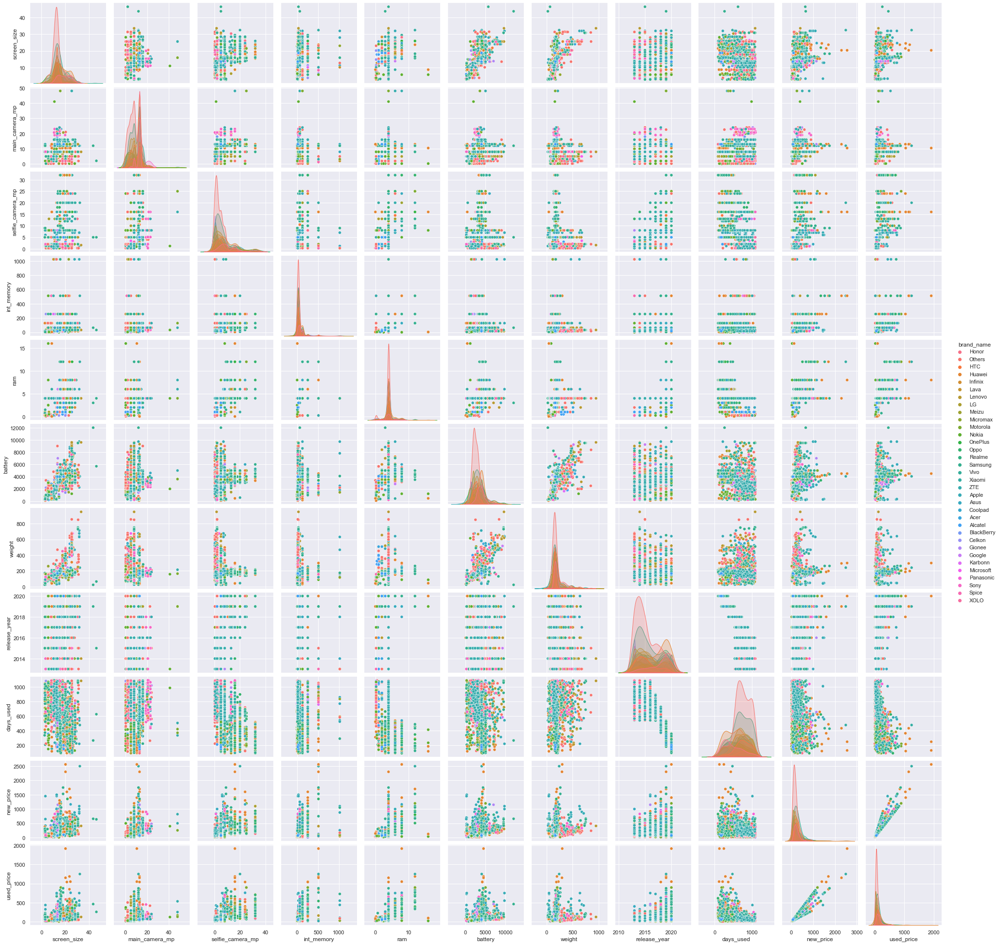

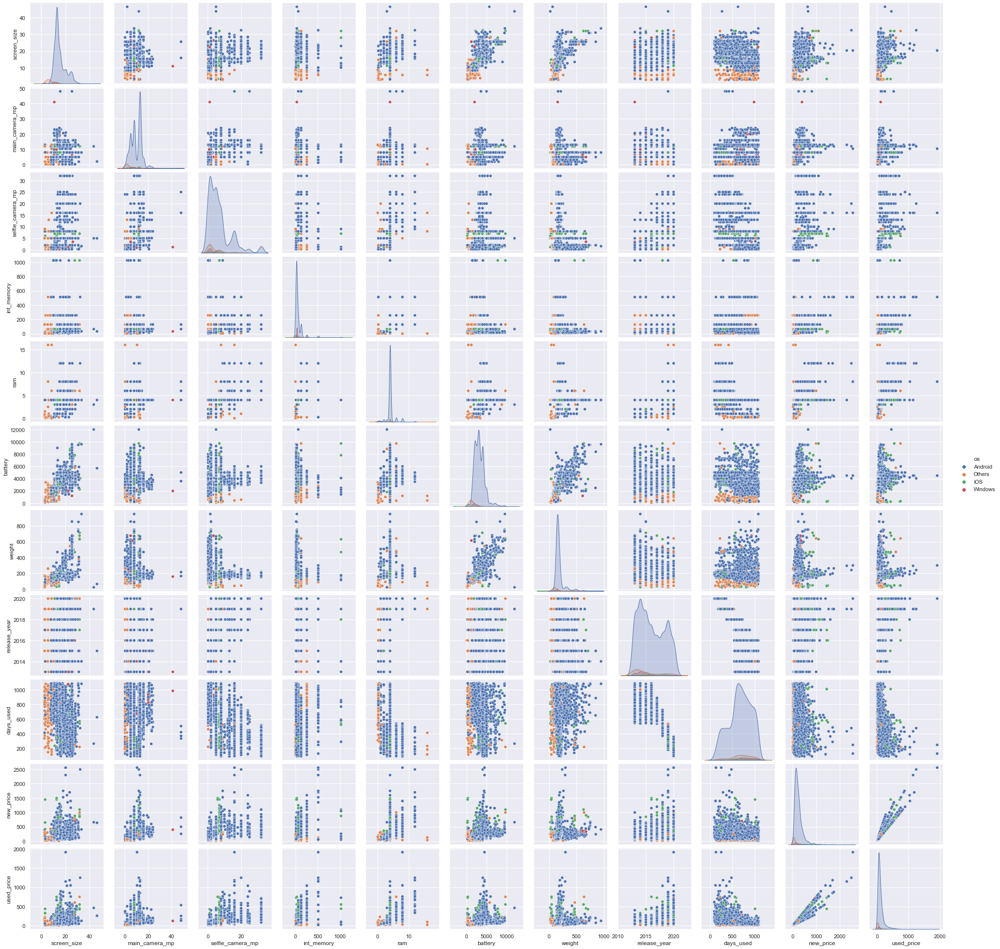

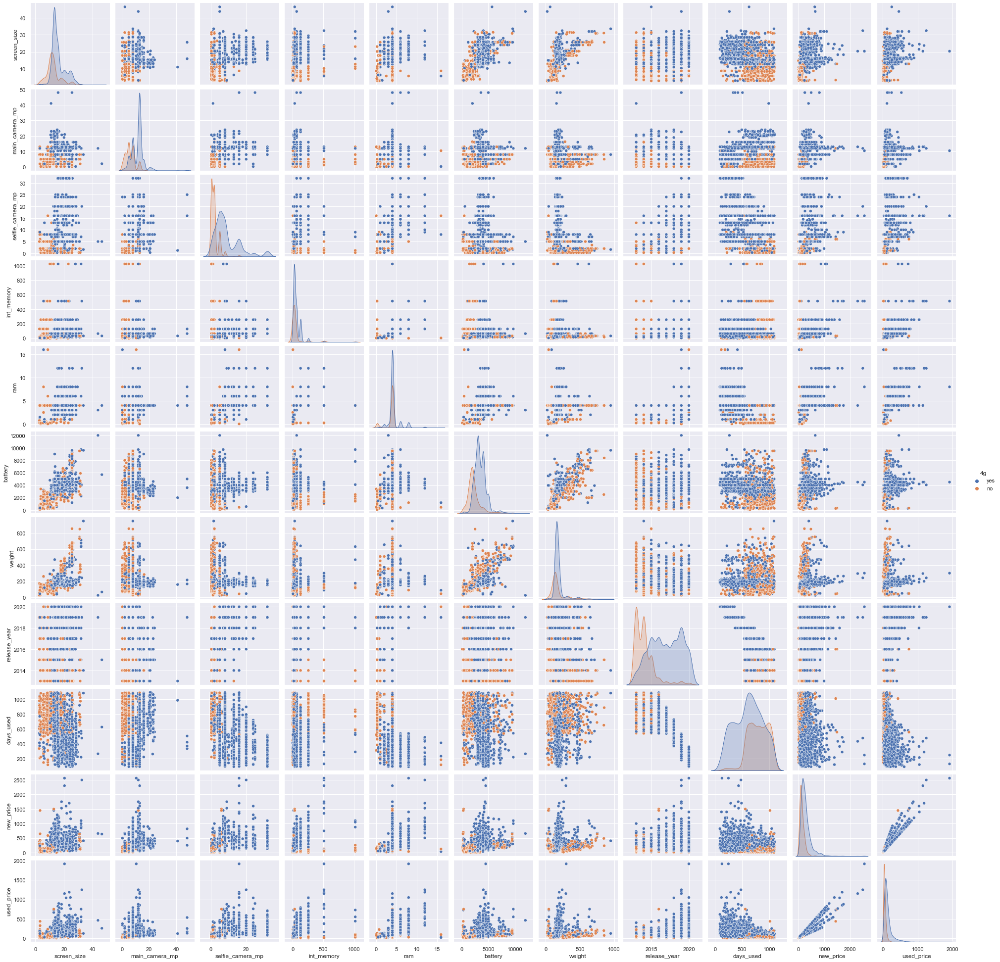

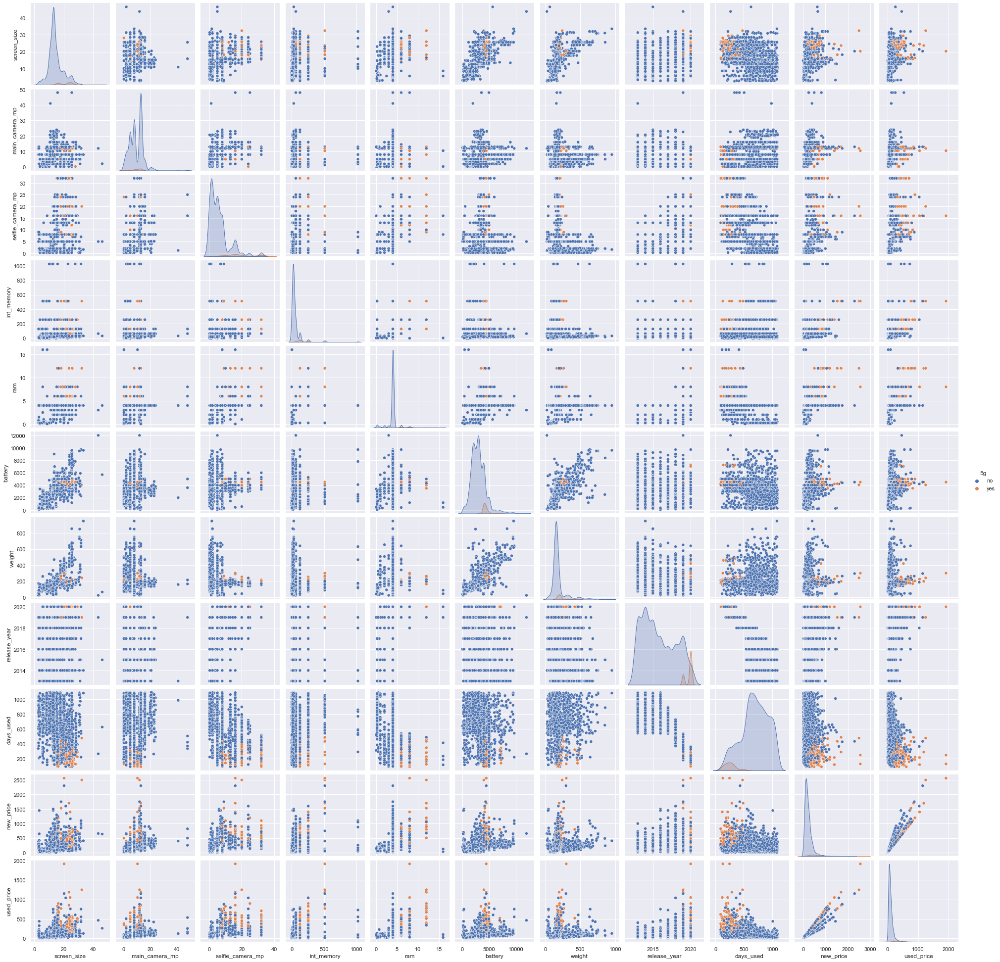

<IPython.core.display.Javascript object>

In [24]:
# pairplot with hue
for i in range(0, len(cat_list)):
    hue_cat = cat_list[i]
    sns.pairplot(df, hue = hue_cat)


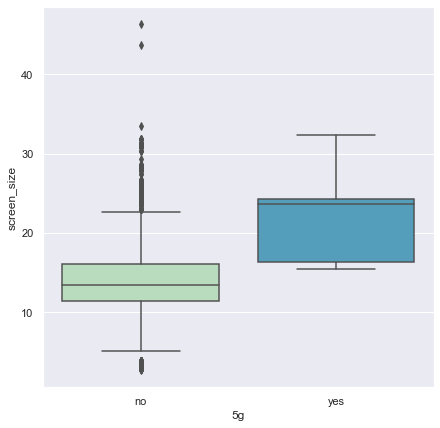

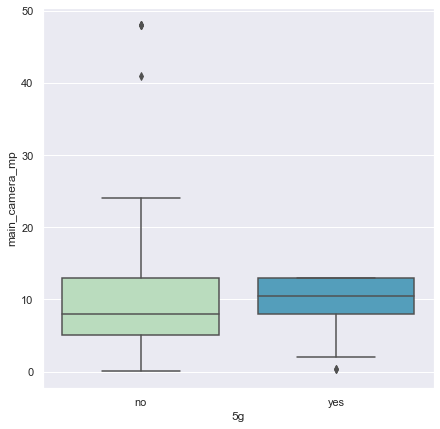

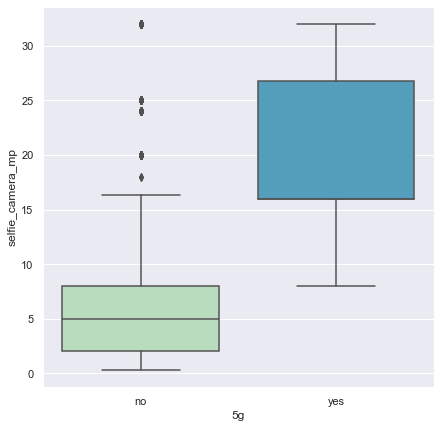

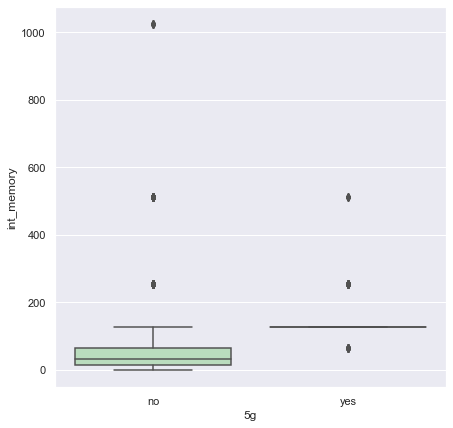

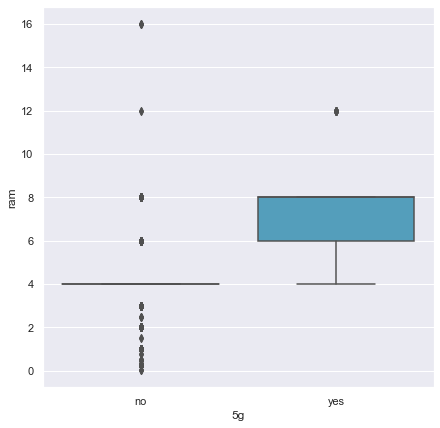

...

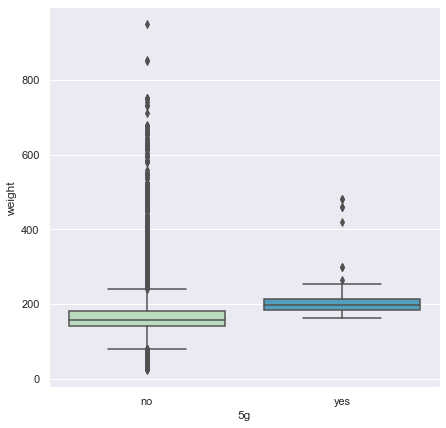

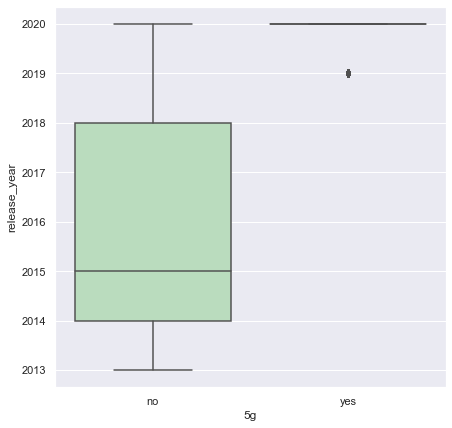

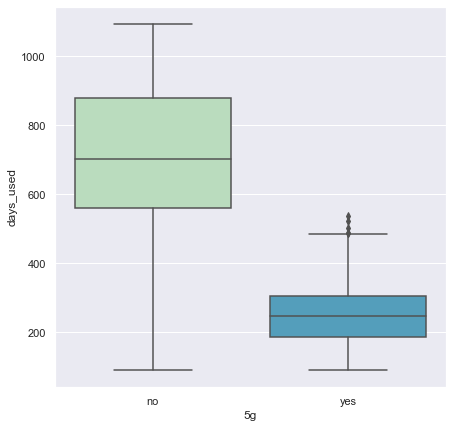

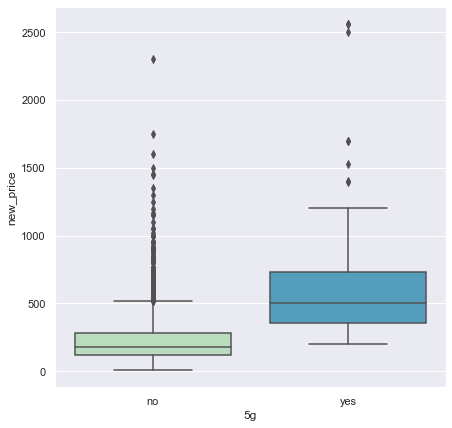

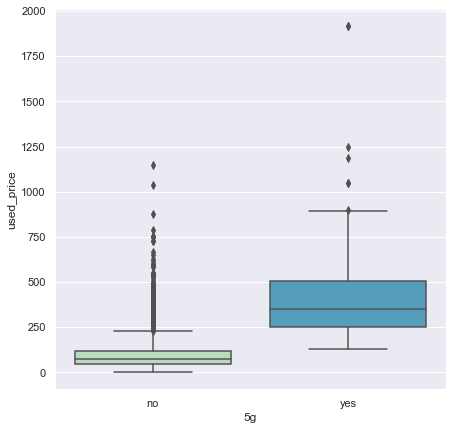

<IPython.core.display.Javascript object>

In [25]:
# box plot
for i in range(0, len(cat_list)):
    cat = cat_list[i]
for j in range(0, len(num_list)):
    num = num_list[j]
    plt.figure(figsize=(7, 7))
    sns.boxplot(x=cat, y=num, data=df, palette="GnBu")

In [26]:
# function to create labeled barplots


def labeled_barplot(data, feature, perc=False, n=None):
    """
    Barplot with percentage at the top

    data: dataframe
    feature: dataframe column
    perc: whether to display percentages instead of count (default is False)
    n: displays the top n category levels (default is None, i.e., display all levels)
    """

    total = len(data[feature])  # length of the column
    count = data[feature].nunique()
    if n is None:
        plt.figure(figsize=(count + 1, 5))
    else:
        plt.figure(figsize=(n + 1, 5))

    plt.xticks(rotation=90, fontsize=15)
    ax = sns.countplot(
        data=data,
        x=feature,
        palette="Paired",
        order=data[feature].value_counts().index[:n].sort_values(),
    )

    for p in ax.patches:
        if perc == True:
            label = "{:.1f}%".format(
                100 * p.get_height() / total
            )  # percentage of each class of the category
        else:
            label = p.get_height()  # count of each level of the category

        x = p.get_x() + p.get_width() / 2  # width of the plot
        y = p.get_height()  # height of the plot

        ax.annotate(
            label,
            (x, y),
            ha="center",
            va="center",
            size=12,
            xytext=(0, 5),
            textcoords="offset points",
        )  # annotate the percentage

    plt.show()  # show the plot

<IPython.core.display.Javascript object>

<div class="alert alert-block alert-info"><b>Insight:</b> 
    
- there are 3571 rows  and 15 variables in the data set   
- used_price is the dependent variable  
    
- outliers in the data do exist; will be addressed  in preprocessing/feature creation
- skewness exists in a number of variables and will be addressed  in preprocessing/feature creation
  
</div>

## Data Preprocessing

In [27]:
####  DROP the os column - 1) iOS as it is perfectly correlated with brand APPLE ##### and 2) users choose "brand" over os.

df["os"].value_counts()

Android    3246
Others      202
Windows      67
iOS          56
Name: os, dtype: int64

<IPython.core.display.Javascript object>

In [28]:
df.drop(["os"], axis=1, inplace=True)

<IPython.core.display.Javascript object>

## The used cell phone data has hidden problems like

    Missing values
    Outliers
    Obvious inconsistencies

### 1 Missing Value Treatment

In [29]:
# Do we have any missing data as a %

missing_count = df.isnull().sum()  # the count of missing values
value_count = df.isnull().count()  # the count of all values
missing_percentage = round(
    missing_count / value_count * 100, 2
)  # the percentage of missing values

missing_df = pd.DataFrame({"count": missing_count, "percentage": missing_percentage})

# create a dataframe
print(missing_df)

                  count  percentage
brand_name            0        0.00
screen_size           0        0.00
4g                    0        0.00
5g                    0        0.00
main_camera_mp      180        5.04
selfie_camera_mp      2        0.06
int_memory           10        0.28
ram                  10        0.28
battery               6        0.17
weight                7        0.20
release_year          0        0.00
days_used             0        0.00
new_price             0        0.00
used_price            0        0.00


<IPython.core.display.Javascript object>

<div class="alert alert-block alert-info"><b>Insight:</b> 
    
- The target variable has no missing  values
- Predictive Varibles that have missing values - main_camera_mp, selfie_camera_mp, int_memory, ram, battery,  and weight         
    
  
</div>

In [30]:
# Step 1: Fill the missing values with for all ALL NUMERIC COLUMNS - We are going to use the median value as so few values are missing from each column.

medianFiller = lambda x: x.fillna(x.median())
numeric_columns = df.select_dtypes(include=np.number).columns.tolist()
df[numeric_columns] = df[numeric_columns].apply(medianFiller, axis=0)

<IPython.core.display.Javascript object>

In [31]:
# Do we have any missing data as a %

missing_count = df.isnull().sum()  # the count of missing values
value_count = df.isnull().count()  # the count of all values
missing_percentage = round(
    missing_count / value_count * 100, 2
)  # the percentage of missing values

missing_df = pd.DataFrame({"count": missing_count, "percentage": missing_percentage})

# create a dataframe
print(missing_df)

                  count  percentage
brand_name            0         0.0
screen_size           0         0.0
4g                    0         0.0
5g                    0         0.0
main_camera_mp        0         0.0
selfie_camera_mp      0         0.0
int_memory            0         0.0
ram                   0         0.0
battery               0         0.0
weight                0         0.0
release_year          0         0.0
days_used             0         0.0
new_price             0         0.0
used_price            0         0.0


<IPython.core.display.Javascript object>

<div class="alert alert-block alert-info"><b>Insight:</b> 
    
- The missing values in the numerical columns have all been addressed.
  
</div>

In [32]:
# Let's look at the statistical summary of the data
pd.set_option(
    "display.float_format", lambda x: "%.3f" % x
)  # to display numbers rounded off to 3 decimal places

df.describe(include="all").T

### YOU CAN SEE A LOT OF RIGHT SKEWNESS look @ max vs 75% tile

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
brand_name,3571,34,Others,509,NaN,NaN,NaN,NaN,NaN,NaN,NaN
screen_size,3571.000,NaN,NaN,NaN,14.804,5.153,2.700,12.700,13.490,16.510,46.360
4g,3571,2,yes,2359,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5g,3571,2,no,3419,NaN,NaN,NaN,NaN,NaN,NaN,NaN
main_camera_mp,3571.000,NaN,NaN,NaN,9.330,4.705,0.080,5.000,8.000,13.000,48.000
selfie_camera_mp,3571.000,NaN,NaN,NaN,6.546,6.878,0.300,2.000,5.000,8.000,32.000
int_memory,3571.000,NaN,NaN,NaN,54.470,84.586,0.005,16.000,32.000,64.000,1024.000
ram,3571.000,NaN,NaN,NaN,4.057,1.390,0.030,4.000,4.000,4.000,16.000
battery,3571.000,NaN,NaN,NaN,3067.113,1363.063,80.000,2100.000,3000.000,4000.000,12000.000
weight,3571.000,NaN,NaN,NaN,179.384,90.197,23.000,140.000,159.000,184.000,950.000


<IPython.core.display.Javascript object>

<div class="alert alert-block alert-info"><b>Insight:</b> 
    
- The missing values in the numerical columns have all been addressed, but there are outliers that will have to be addressed in a future step.
  
</div>

## Feature Creation

In [33]:
## 2: Feature Creation - Lets create a "totalmem'= Int + Ram since they are on the same scale

df["totalmem"] = df["ram"] + df["int_memory"]

<IPython.core.display.Javascript object>

In [34]:
# lets look at the the data to get a sense of the counts
df["totalmem"].value_counts()

20.000      1277
36.000      1005
68.000       444
132.000      152
136.000      106
134.000      104
35.000        60
34.000        49
70.000        49
18.000        41
512.250       33
256.250       32
260.000       28
264.000       22
67.000        22
17.000        14
32.250        11
9.000         11
128.250       10
268.000       10
1028.000       8
5.000          7
4.500          7
516.000        6
16.250         6
33.000         5
4.005          5
64.250         5
524.000        4
0.750          4
2.505          4
140.000        4
4.030          2
8.000          2
16.020         2
8.020          2
4.200          2
4.750          2
262.000        2
16.500         2
520.000        2
8.500          2
0.090          1
28.000         1
5.500          1
0.270          1
17.500         1
0.260          1
Name: totalmem, dtype: int64

<IPython.core.display.Javascript object>

In [35]:
# Drop Ram and Int_Mem columns in Df

df.drop(["ram"], axis=1, inplace=True)
df.drop(["int_memory"], axis=1, inplace=True)

<IPython.core.display.Javascript object>

<div class="alert alert-block alert-info"><b>Insight:</b> 
    
- I have dropped the 'ram' and 'initial memory' columns ... and replaced those with a single column called "total memory'
  
</div>

In [36]:
# Let's look at the statistical summary of the data
pd.set_option(
    "display.float_format", lambda x: "%.3f" % x
)  # to display numbers rounded off to 3 decimal places

df.describe(include="all").T

### YOU CAN SEE A LOT OF RIGHT SKEWNESS look @ max vs 75% tile

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
brand_name,3571,34,Others,509,NaN,NaN,NaN,NaN,NaN,NaN,NaN
screen_size,3571.000,NaN,NaN,NaN,14.804,5.153,2.700,12.700,13.490,16.510,46.360
4g,3571,2,yes,2359,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5g,3571,2,no,3419,NaN,NaN,NaN,NaN,NaN,NaN,NaN
main_camera_mp,3571.000,NaN,NaN,NaN,9.330,4.705,0.080,5.000,8.000,13.000,48.000
selfie_camera_mp,3571.000,NaN,NaN,NaN,6.546,6.878,0.300,2.000,5.000,8.000,32.000
battery,3571.000,NaN,NaN,NaN,3067.113,1363.063,80.000,2100.000,3000.000,4000.000,12000.000
weight,3571.000,NaN,NaN,NaN,179.384,90.197,23.000,140.000,159.000,184.000,950.000
release_year,3571.000,NaN,NaN,NaN,2015.965,2.292,2013.000,2014.000,2016.000,2018.000,2020.000
days_used,3571.000,NaN,NaN,NaN,675.391,248.641,91.000,536.000,690.000,872.000,1094.000


<IPython.core.display.Javascript object>

In [37]:
df.skew()

screen_size         0.858
main_camera_mp      0.787
selfie_camera_mp    1.824
battery             1.171
weight              3.147
release_year        0.320
days_used          -0.342
new_price           3.739
used_price          4.749
totalmem            5.710
dtype: float64

<IPython.core.display.Javascript object>

In [38]:
df.kurtosis()

screen_size         1.212
main_camera_mp      5.012
selfie_camera_mp    3.478
battery             3.306
weight             12.869
release_year       -1.219
days_used          -0.683
new_price          26.472
used_price         41.151
totalmem           47.023
dtype: float64

<IPython.core.display.Javascript object>

In [39]:
# populate the list of numeric attributes and categorical attributes
num_list = []
cat_list = []

for column in df:
    if is_numeric_dtype(df[column]):
        num_list.append(column)
    elif is_string_dtype(df[column]):
        cat_list.append(column)

print(num_list)
print(cat_list)

['screen_size', 'main_camera_mp', 'selfie_camera_mp', 'battery', 'weight', 'release_year', 'days_used', 'new_price', 'used_price', 'totalmem']
['brand_name', '4g', '5g']


<IPython.core.display.Javascript object>

<div class="alert alert-block alert-info"><b>Insight:</b> 
    
- There "may be outliers" that we can test for latter in used_price, battery weight, and initial memory. Skewness essentially measures the symmetry of the distribution, while kurtosis determines the heaviness of the distribution tails.
    
- screen size and main camera look normal    
- ram is left skewed 
- battery is right skewed
- weight is left skewed
- years is left ... a lot of older phones in the used market
- days used is right skewed ... the opposite of years, peopl euse them for a long time before they get a new one 
- new price is left skewed  

SKEWNESS    
- If the skewness is between -0.5 and 0.5, the data are fairly symmetrical
- If the skewness is between -1 and — 0.5 or between 0.5 and 1, the data are moderately skewed   
- If the skewness is less than -1 or greater than 1, the data are highly skewed

    
selfie_camera_mp    1.824
weight              3.147
new_price           3.739
used_price          4.749
totalmem            5.710   

    
KURTOSIS
    
    

· High kurtosis > 3 in a data set is an indicator that data has heavy outliers.

· Low kurtosis  <3 in a data set is an indicator that data has lack of outliers.

·  - 3 If kurtosis value + means pointy and — means flat and no outliers    
    
High kurtosis > 3 in a data set is an indicator that data has heavy outliers.
    
main_camera_mp      5.012
selfie_camera_mp    3.478
battery             3.306
weight             12.869
new_price          26.472
used_price         41.151
totalmem           47.023
      
</div>

### Why are there 'cell phones' that have 40+centimeters ???? screens ... could these be tablets or PC that mistakeningly got added to the used "cell phone" list?**

In [40]:
# Research note
# iPhone 13 Pro Max 6.7-inch screen
# Samsung Galaxy S21 Ultra 6.8-inch screen.
# Galaxy Z Fold 3-  7.6-inch screen

# How many are there > 8inches or 20.32 centimeters
screen = df.loc[df["screen_size"] > 20.32].count()
screen

brand_name          509
screen_size         509
4g                  509
5g                  509
main_camera_mp      509
selfie_camera_mp    509
battery             509
weight              509
release_year        509
days_used           509
new_price           509
used_price          509
totalmem            509
dtype: int64

<IPython.core.display.Javascript object>

In [41]:
# Lets remove these from the used phone list ... they appear to be tablets based on the screen size.
df = df[df["screen_size"] <= 20.32]


<IPython.core.display.Javascript object>

<div class="alert alert-block alert-info"><b>Insight:</b> 
    
- Based on my current research, there is suitable evidence to drop items that appear to be "tablets' because of their screen size; while they might have 4g/5g capability this point of this model is to price used phones ... tablets will require more daata and should not be a factor in this pricing model.
  
</div>

<div class="alert alert-block alert-info"><b>Insight:</b> 
    
By binning the total memory, it will make it easier to distinguish between the low and high memory phones and "used price"       
    
  
</div>

## Feature Creation II

<AxesSubplot:ylabel='Frequency'>

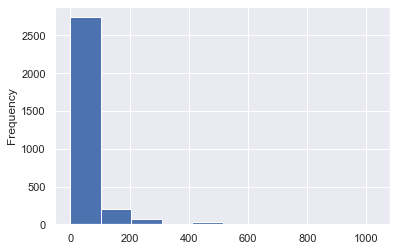

<IPython.core.display.Javascript object>

In [42]:
df["totalmem"].plot(kind="hist")

In [43]:
# can add custom labels
df["bintotalmem"] = pd.cut(
    df["totalmem"], [-0.938, 257.068, 514.045,  771.023, 1028.0], 
    labels = ["bronze", "silver", "gold", "platnium"]
)

df["bintotalmem"].value_counts(dropna=False)


bronze      2980
silver        70
gold           7
platnium       5
Name: bintotalmem, dtype: int64

<IPython.core.display.Javascript object>

In [44]:
df.drop(["totalmem"], axis=1, inplace=True)

<IPython.core.display.Javascript object>

In [45]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3062 entries, 4 to 3570
Data columns (total 13 columns):
 #   Column            Non-Null Count  Dtype   
---  ------            --------------  -----   
 0   brand_name        3062 non-null   object  
 1   screen_size       3062 non-null   float64 
 2   4g                3062 non-null   object  
 3   5g                3062 non-null   object  
 4   main_camera_mp    3062 non-null   float64 
 5   selfie_camera_mp  3062 non-null   float64 
 6   battery           3062 non-null   float64 
 7   weight            3062 non-null   float64 
 8   release_year      3062 non-null   int64   
 9   days_used         3062 non-null   int64   
 10  new_price         3062 non-null   float64 
 11  used_price        3062 non-null   float64 
 12  bintotalmem       3062 non-null   category
dtypes: category(1), float64(7), int64(2), object(3)
memory usage: 314.2+ KB


<IPython.core.display.Javascript object>

In [46]:
df["bintotalmem"].value_counts()

bronze      2980
silver        70
gold           7
platnium       5
Name: bintotalmem, dtype: int64

<IPython.core.display.Javascript object>

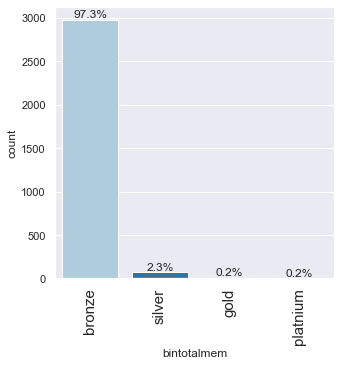

<IPython.core.display.Javascript object>

In [47]:
sns.set(rc={'figure.figsize':(11.7,8.27)})
labeled_barplot(df, "bintotalmem", perc=True)


## Feature Creation III - Change the used and new prices to log versions

In [48]:
df["used_price_log"] = np.log(df["used_price"])
df["new_price_log"] = np.log(df["new_price"])

<IPython.core.display.Javascript object>

In [49]:
df.drop(["used_price"], axis=1, inplace=True)
df.drop(["new_price"], axis=1, inplace=True)

<IPython.core.display.Javascript object>

In [50]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3062 entries, 4 to 3570
Data columns (total 13 columns):
 #   Column            Non-Null Count  Dtype   
---  ------            --------------  -----   
 0   brand_name        3062 non-null   object  
 1   screen_size       3062 non-null   float64 
 2   4g                3062 non-null   object  
 3   5g                3062 non-null   object  
 4   main_camera_mp    3062 non-null   float64 
 5   selfie_camera_mp  3062 non-null   float64 
 6   battery           3062 non-null   float64 
 7   weight            3062 non-null   float64 
 8   release_year      3062 non-null   int64   
 9   days_used         3062 non-null   int64   
 10  bintotalmem       3062 non-null   category
 11  used_price_log    3062 non-null   float64 
 12  new_price_log     3062 non-null   float64 
dtypes: category(1), float64(7), int64(2), object(3)
memory usage: 378.7+ KB


<IPython.core.display.Javascript object>

<div class="alert alert-block alert-info"><b>Insight:</b> 
    
Most of the used phones have 20 or less total memory.
  
</div>

## Data Preprocessing II 

In [51]:
# populate the list of numeric attributes and categorical attributes
num_list = []
cat_list = []

for column in df:
    if is_numeric_dtype(df[column]):
        num_list.append(column)
    elif is_string_dtype(df[column]):
        cat_list.append(column)

print(num_list)
print(cat_list)

['screen_size', 'main_camera_mp', 'selfie_camera_mp', 'battery', 'weight', 'release_year', 'days_used', 'used_price_log', 'new_price_log']
['brand_name', '4g', '5g']


<IPython.core.display.Javascript object>

### Outlier Detection

    Let's look at outliers in every numerical column


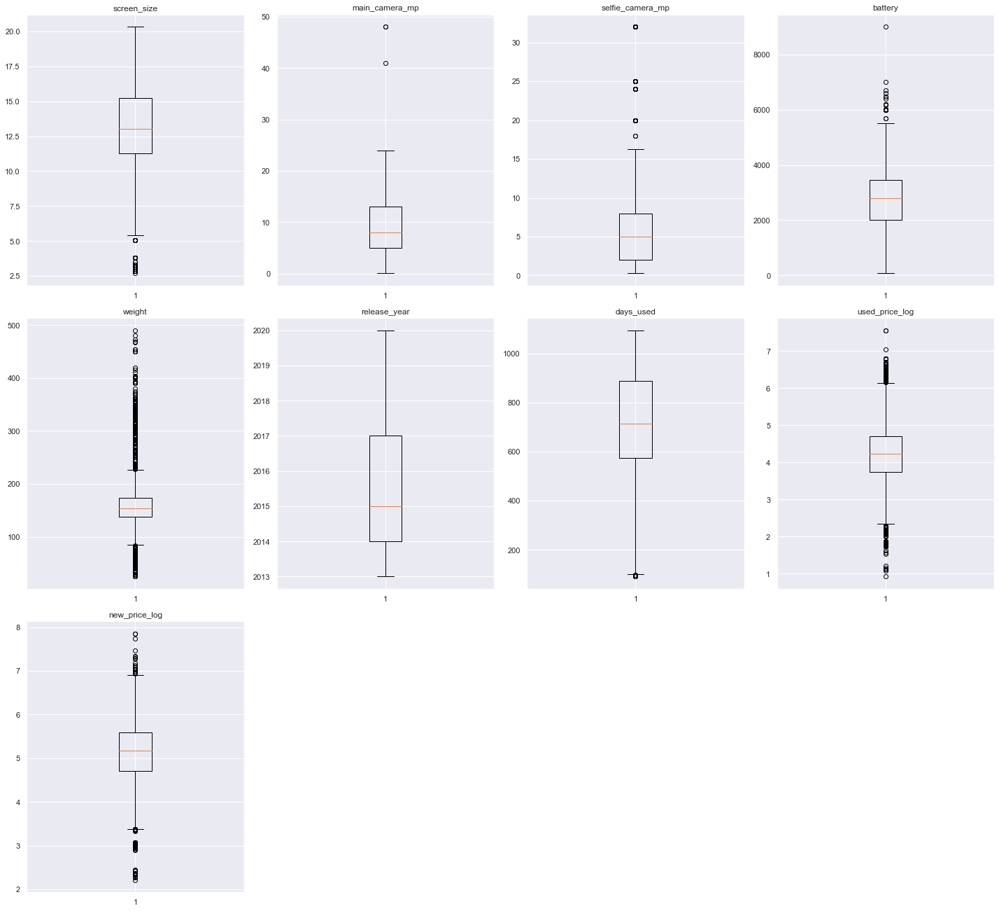

<IPython.core.display.Javascript object>

In [52]:
# let's plot the boxplots of all columns to check for outliers
plt.figure(figsize=(20, 30))

for i, variable in enumerate(num_list):
    plt.subplot(5, 4, i + 1)
    plt.boxplot(df[variable], whis=1.5)
    plt.tight_layout()
    plt.title(variable)

plt.show()

<div class="alert alert-block alert-info"><b>Insight:</b> 

All of these still have high skewness and you can see that in the outliers on the graphs.    

</div>

# Treat outliers by flooring and capping.

In [53]:
def treat_outliers(df, col):
    """
    treats outliers in a variable
    col: str, name of the numerical variable
    df: dataframe
    col: name of the column
    """
    Q1 = df[col].quantile(0.25)  # 25th quantile
    Q3 = df[col].quantile(0.75)  # 75th quantile
    IQR = Q3 - Q1
    Lower_Whisker = Q1 - 1.5 * IQR
    Upper_Whisker = Q3 + 1.5 * IQR

    # all the values smaller than Lower_Whisker will be assigned the value of Lower_Whisker
    # all the values greater than Upper_Whisker will be assigned the value of Upper_Whisker
    df[col] = np.clip(df[col], Lower_Whisker, Upper_Whisker)

    return df


def treat_outliers_all(df, col_list):
    """
    treat outlier in all numerical variables
    col_list: list of numerical variables
    df: data frame
    """
    for c in col_list:
        df = treat_outliers(df, c)

    return df

<IPython.core.display.Javascript object>

In [54]:
# treating the outliers in every column
num_list = df.select_dtypes(include=np.number).columns.tolist()
df = treat_outliers_all(df, num_list)

<IPython.core.display.Javascript object>

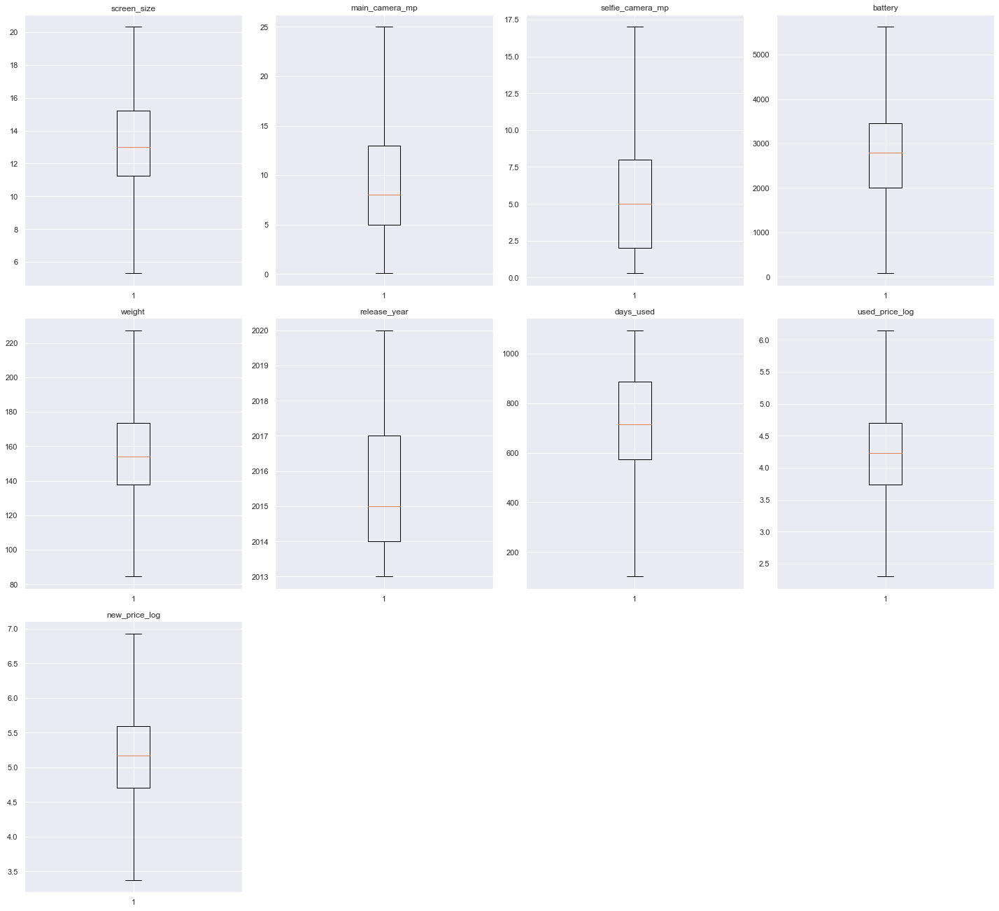

<IPython.core.display.Javascript object>

In [55]:
# let's plot the boxplots of all columns to check for outliers
plt.figure(figsize=(20, 30))

for i, variable in enumerate(num_list):
    plt.subplot(5, 4, i + 1)
    plt.boxplot(df[variable], whis=1.5)
    plt.tight_layout()
    plt.title(variable)

plt.show()

In [56]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3062 entries, 4 to 3570
Data columns (total 13 columns):
 #   Column            Non-Null Count  Dtype   
---  ------            --------------  -----   
 0   brand_name        3062 non-null   object  
 1   screen_size       3062 non-null   float64 
 2   4g                3062 non-null   object  
 3   5g                3062 non-null   object  
 4   main_camera_mp    3062 non-null   float64 
 5   selfie_camera_mp  3062 non-null   float64 
 6   battery           3062 non-null   float64 
 7   weight            3062 non-null   float64 
 8   release_year      3062 non-null   int64   
 9   days_used         3062 non-null   float64 
 10  bintotalmem       3062 non-null   category
 11  used_price_log    3062 non-null   float64 
 12  new_price_log     3062 non-null   float64 
dtypes: category(1), float64(8), int64(1), object(3)
memory usage: 378.7+ KB


<IPython.core.display.Javascript object>

<div class="alert alert-block alert-info"><b>Insight:</b> 
    
The outliers have all been adressed, so we can proceed to building the model.
  
</div>

# NOTE THE PANDAS PROFILING REPORT POST ALL DATA TRANSFORMATION & FEATURE CREATION DOES NOT RENDER IN THE HTML VERSION OF THIS SUBMISSION

In [57]:
profile = ProfileReport(
    df,
    title="Used Phone Data EDA - Processed Data",
    html={"style": {"full_width": True}},
    sort=None,
)
profile.to_widgets()

Summarize dataset:   0%|          | 0/27 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render widgets:   0%|          | 0/1 [00:00<?, ?it/s]

<IPython.core.display.Javascript object>

### Linear Model Building

    We want to predict the used price.

    Before we proceed to build a model, we'll have to encode categorical features.

    We'll split the data into train and test to be able to evaluate the model that we build on the train data.

    We will build a Linear Regression model using the train data and then check it's performance.



In [58]:
# defining X and y variables - used price log is the predicated so DROP them
X = df.drop(["used_price_log"], axis=1)
y = df["used_price_log"]

print(X.head())
print(y.head())

   brand_name  screen_size   4g  5g  main_camera_mp  selfie_camera_mp  \
4       Honor       15.720  yes  no          13.000             8.000   
6       Honor       19.840  yes  no           8.000             5.000   
7       Honor       18.570  yes  no          13.000             8.000   
8       Honor       15.720  yes  no          13.000            16.000   
10      Honor       16.670  yes  no          13.000             8.000   

    battery  weight  release_year  days_used bintotalmem  new_price_log  
4  5000.000 185.000          2020    293.000      bronze          4.948  
6  3020.000 144.000          2020    234.000      bronze          4.519  
7  3400.000 164.000          2020    219.000      bronze          5.189  
8  4000.000 165.000          2020    161.000      bronze          5.300  
10 3020.000 150.000          2020    268.000      bronze          4.714  
4    4.642
6    4.281
7    4.890
8    5.016
10   4.463
Name: used_price_log, dtype: float64


<IPython.core.display.Javascript object>

In [59]:
#### CHANGE CATEGORICAL & Object VALUES TO 1 or ZERO Using Pd.Dummies
X = pd.get_dummies(
    X,
    columns=X.select_dtypes(include=["category", "object"]).columns.tolist(),
    drop_first=True,
)
X.head()

,screen_size,main_camera_mp,selfie_camera_mp,battery,weight,release_year,days_used,new_price_log,brand_name_Alcatel,brand_name_Apple,brand_name_Asus,brand_name_BlackBerry,brand_name_Celkon,brand_name_Coolpad,brand_name_Gionee,brand_name_Google,brand_name_HTC,brand_name_Honor,brand_name_Huawei,brand_name_Infinix,brand_name_Karbonn,brand_name_LG,brand_name_Lava,brand_name_Lenovo,brand_name_Meizu,brand_name_Micromax,brand_name_Microsoft,brand_name_Motorola,brand_name_Nokia,brand_name_OnePlus,brand_name_Oppo,brand_name_Others,brand_name_Panasonic,brand_name_Realme,brand_name_Samsung,brand_name_Sony,brand_name_Spice,brand_name_Vivo,brand_name_XOLO,brand_name_Xiaomi,brand_name_ZTE,4g_yes,5g_yes,bintotalmem_silver,bintotalmem_gold,bintotalmem_platnium
4,15.720,13.000,8.000,5000.000,185.000,2020,293.000,4.948,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0
6,19.840,8.000,5.000,3020.000,144.000,2020,234.000,4.519,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0
7,18.570,13.000,8.000,3400.000,164.000,2020,219.000,5.189,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0
8,15.720,13.000,16.000,4000.000,165.000,2020,161.000,5.300,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0
10,16.670,13.000,8.000,3020.000,150.000,2020,268.000,4.714,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0


<IPython.core.display.Javascript object>

In [60]:
# splitting the data in 70:30 ratio for train to test data

x_train, x_test, y_train, y_test = train_test_split(
    X,
    y,
    test_size=0.3,
    random_state=42,  # this number ensures the same rows are selected everytime...random seed you can replicate across runs.
)

<IPython.core.display.Javascript object>

In [61]:
print("Number of rows in train data =", x_train.shape[0])
print("Number of rows in test data =", x_test.shape[0])

Number of rows in train data = 2143
Number of rows in test data = 919


<IPython.core.display.Javascript object>

<div class="alert alert-block alert-info"><b>Insight:</b> 

The last and final step, we've taken the categorical and objects and turned them into dummies (0 or 1) to ease the interpetation.    
    
After splitting the data
    
- Number of rows in train data = 2143
- Number of rows in test data = 919

<div>

In [62]:
# fitting the model on the train data (70% of the whole data)
from sklearn.linear_model import LinearRegression

linearregression = LinearRegression()
linearregression.fit(x_train, y_train)

LinearRegression()

<IPython.core.display.Javascript object>

**Let's check the coefficients and intercept of the model.**

In [63]:
coef_df = pd.DataFrame(
    np.append(linearregression.coef_, linearregression.intercept_),
    index=x_train.columns.tolist() + ["Intercept"],
    columns=["Coefficients"],
)

coef_df

,Coefficients
screen_size,0.002
main_camera_mp,0.000
selfie_camera_mp,0.001
battery,-0.000
weight,0.000
release_year,0.004
days_used,-0.001
new_price_log,0.991
brand_name_Alcatel,0.002
brand_name_Apple,0.010


<IPython.core.display.Javascript object>

<div class="alert alert-block alert-info"><b>Insight:</b> 
    
 - You can see the +/positive coefficient will add to the 'used price' e.g. Selfie Camera MP is important.   

<div>

**Let's check the performance of the model using different metrics.**

* We will be using metric functions defined in sklearn for RMSE, MAE, and $R^2$.
* We will define a function to calculate MAPE and adjusted $R^2$.
    - The mean absolute percentage error (MAPE) measures the accuracy of predictions as a percentage, and can be calculated as the average absolute percent error for each predicted value minus actual values divided by actual values. It works best if there are no extreme values in the data and none of the actual values are 0.
    
* We will create a function which will print out all the above metrics in one go.

In [64]:
# function to compute adjusted R-squared
def adj_r2_score(predictors, targets, predictions):
    r2 = r2_score(targets, predictions)
    n = predictors.shape[0]
    k = predictors.shape[1]
    return 1 - ((1 - r2) * (n - 1) / (n - k - 1))


# function to compute MAPE
def mape_score(targets, predictions):
    return np.mean(np.abs(targets - predictions) / targets) * 100


# function to compute different metrics to check performance of a regression model
def model_performance_regression(model, predictors, target):
    """
    Function to compute different metrics to check regression model performance

    model: regressor
    predictors: independent variables
    target: dependent variable
    """

    # predicting using the independent variables
    pred = model.predict(predictors)

    r2 = r2_score(target, pred)  # to compute R-squared
    adjr2 = adj_r2_score(predictors, target, pred)  # to compute adjusted R-squared
    rmse = np.sqrt(mean_squared_error(target, pred))  # to compute RMSE
    mae = mean_absolute_error(target, pred)  # to compute MAE
    mape = mape_score(target, pred)  # to compute MAPE

    # creating a dataframe of metrics
    df_perf = pd.DataFrame(
        {
            "RMSE": rmse,
            "MAE": mae,
            "R-squared": r2,
            "Adj. R-squared": adjr2,
            "MAPE": mape,
        },
        index=[0],
    )

    return df_perf

<IPython.core.display.Javascript object>

In [65]:
# checking model performance on train set (seen 70% data)
print("Training Performance\n")
linearregression_train_perf = model_performance_regression(
    linearregression, x_train, y_train
)
linearregression_train_perf

Training Performance



,RMSE,MAE,R-squared,Adj. R-squared,MAPE
0,0.091,0.074,0.986,0.985,1.847


<IPython.core.display.Javascript object>

In [66]:
# checking model performance on test set (seen 30% data)
print("Test Performance\n")
linearregression_test_perf = model_performance_regression(
    linearregression, x_test, y_test
)
linearregression_test_perf

Test Performance



,RMSE,MAE,R-squared,Adj. R-squared,MAPE
0,0.097,0.078,0.984,0.983,1.922


<IPython.core.display.Javascript object>

<div class="alert alert-block alert-info"><b>Insight:</b> 
    
 - You can see the +/positive coefficient will add to the 'used price' e.g. Selfie Camera MP is important.   


    
    
The training 𝑅2 is 98.6%, indicating that the model explains 98.6%of the variation in the train data. So, the model is not underfitting.

MAE and RMSE on the train and test sets are comparable, which shows that the model is not overfitting.

MAE indicates that our current model is able to predict used price within a mean error of $.078  on the test data.

MAPE on the test set suggests we can predict within 1.922% of the used price.
   
</div>

### Linear Regression using statsmodels

    Let's build a linear regression model using statsmodels.



In [67]:
# unlike sklearn, statsmodels does not add a constant to the data on its own
# we have to add the constant manually
x_train1 = sm.add_constant(x_train)
# adding constant to the test data
x_test1 = sm.add_constant(x_test)

olsmod0 = sm.OLS(y_train, x_train1).fit()
print(olsmod0.summary())

                            OLS Regression Results                            
Dep. Variable:         used_price_log   R-squared:                       0.986
Model:                            OLS   Adj. R-squared:                  0.985
Method:                 Least Squares   F-statistic:                     3117.
Date:                Thu, 21 Oct 2021   Prob (F-statistic):               0.00
Time:                        18:29:13   Log-Likelihood:                 2104.3
No. Observations:                2143   AIC:                            -4115.
Df Residuals:                    2096   BIC:                            -3848.
Df Model:                          46                                         
Covariance Type:            nonrobust                                         
                            coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------
const                    -8.82

<IPython.core.display.Javascript object>

<div class="alert alert-block alert-info"><b>Insight:</b> 
    
- Negative values of the coefficient show that *Used Price* decreases with the increase of corresponding attribute value.

- Positive values of the coefficient show that *Used Price* increases with the increase of corresponding attribute value.

- p-value of a variable indicates if the variable is significant or not. If we consider the significance level to be 0.05 (5%), then any variable with a p-value less than 0.05 would be considered significant.

- But these variables might contain multicollinearity, which will affect the p-values.

- So, we need to deal with multicollinearity and check the other assumptions of linear regression first, and then look at the p-values.



  
</div>

### Checking Linear Regression Assumptions

We will be checking the following Linear Regression assumptions:

1. **No Multicollinearity**

2. **Linearity of variables**

3. **Independence of error terms**

4. **Normality of error terms**

5. **No Heteroscedasticity**

### TEST FOR MULTICOLLINEARITY

    Multicollinearity occurs when predictor variables in a regression model are correlated. This correlation is a problem because predictor variables should be independent. If the correlation between variables is high, it can cause problems when we fit the model and interpret the results. When we have multicollinearity in the linear model, the coefficients that the model suggests are unreliable.

    There are different ways of detecting (or testing) multicollinearity. One such way is by using the Variance Inflation Factor, or VIF.

    Variance Inflation Factor (VIF): Variance inflation factors measure the inflation in the variances of the regression parameter estimates due to collinearities that exist among the predictors. It is a measure of how much the variance of the estimated regression coefficient 𝛽𝑘

is "inflated" by the existence of correlation among the predictor variables in the model.

    If VIF is 1, then there is no correlation among the 𝑘

th predictor and the remaining predictor variables, and hence, the variance of 𝛽𝑘

    is not inflated at all.

General Rule of thumb:

    If VIF is between 1 and 5, then there is low multicollinearity.
    If VIF is between 5 and 10, we say there is moderate multicollinearity.
    If VIF is exceeding 10, it shows signs of high multicollinearity.



In [68]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

# we will define a function to check VIF
def checking_vif(predictors):
    vif = pd.DataFrame()
    vif["feature"] = predictors.columns

    # calculating VIF for each feature
    vif["VIF"] = [
        variance_inflation_factor(predictors.values, i)
        for i in range(len(predictors.columns))
    ]
    return vif

<IPython.core.display.Javascript object>

In [69]:
checking_vif(x_train1)

,feature,VIF
0,const,3966439.052
1,screen_size,3.310
2,main_camera_mp,2.426
3,selfie_camera_mp,3.379
4,battery,4.083
5,weight,3.309
6,release_year,4.474
7,days_used,2.196
8,new_price_log,2.900
9,brand_name_Alcatel,3.475


<IPython.core.display.Javascript object>

<div class="alert alert-block alert-info"><b>Insight:</b> 

   If there is perfect correlation, then VIF = infinity. This shows a perfect correlation between two independent variables. In the case of perfect correlation, we get R2 =1, which lead to 1/(1-R2) infinity. To solve this problem we need to drop one of the variables from the dataset which is causing this perfect multicollinearity.
    
    
-   "brand_name_Huawei",
    "brand_name_LG",
    "brand_name_Others",
    "brand_name_Samsung",have VIF greater than 5.

This makes sense, given its all "Apple" or "Everything Else" and these tend to be among the top Android makers if users dont buy apple.
    
** Note: above where we DROPPED the os column - 1) iOS as it is perfectly correlated with brand APPLE well before this step.

    
    
  
</div>

### Removing Multicollinearity

To remove multicollinearity

    Drop every column one by one that has a VIF score greater than 5.
    Look at the adjusted R-squared and RMSE of all these models.
    Drop the variable that makes the least change in adjusted R-squared.
    Check the VIF scores again.
    Continue till you get all VIF scores under 5.

Let's define a function that will help us do this.


In [70]:
def treating_multicollinearity(predictors, target, high_vif_columns):
    """
    Checking the effect of dropping the columns showing high multicollinearity
    on model performance (adj. R-squared and RMSE)

    predictors: independent variables
    target: dependent variable
    high_vif_columns: columns having high VIF
    """
    # empty lists to store adj. R-squared and RMSE values
    adj_r2 = []
    rmse = []

    # build ols models by dropping one of the high VIF columns at a time
    # store the adjusted R-squared and RMSE in the lists defined previously
    for cols in high_vif_columns:
        # defining the new train set
        train = predictors.loc[:, ~predictors.columns.str.startswith(cols)]

        # create the model
        olsmodel = sm.OLS(target, train).fit()

        # adding adj. R-squared and RMSE to the lists
        adj_r2.append(olsmodel.rsquared_adj)
        rmse.append(np.sqrt(olsmodel.mse_resid))

    # creating a dataframe for the results
    temp = pd.DataFrame(
        {
            "col": high_vif_columns,
            "Adj. R-squared after_dropping col": adj_r2,
            "RMSE after dropping col": rmse,
        }
    ).sort_values(by="Adj. R-squared after_dropping col", ascending=False)
    temp.reset_index(drop=True, inplace=True)

    return temp

<IPython.core.display.Javascript object>

In [71]:
col_list = [
    "brand_name_Huawei",
    "brand_name_LG",
    "brand_name_Others",
    "brand_name_Samsung",
]

res = treating_multicollinearity(x_train1, y_train, col_list)
res

,col,Adj. R-squared after_dropping col,RMSE after dropping col
0,brand_name_Others,0.985,0.092
1,brand_name_Samsung,0.985,0.092
2,brand_name_LG,0.985,0.092
3,brand_name_Huawei,0.985,0.092


<IPython.core.display.Javascript object>

<div class="alert alert-block alert-info"><b>Insight:</b> 
    
- Drop brand_name_others first as it impacts RMSE the most.    
  
</div>

In [72]:
col_to_drop = "brand_name_Others"
x_train2 = x_train1.loc[:, ~x_train1.columns.str.startswith(col_to_drop)]
x_test2 = x_test1.loc[:, ~x_test1.columns.str.startswith(col_to_drop)]

# Check VIF now
vif = checking_vif(x_train2)
print("VIF after dropping ", col_to_drop)
vif

VIF after dropping  brand_name_Others


,feature,VIF
0,const,3963518.688
1,screen_size,3.299
2,main_camera_mp,2.426
3,selfie_camera_mp,3.378
4,battery,4.082
5,weight,3.306
6,release_year,4.469
7,days_used,2.196
8,new_price_log,2.899
9,brand_name_Alcatel,1.218


<IPython.core.display.Javascript object>

<div class="alert alert-block alert-info"><b>Insight:</b> 
    
After dropping brand_name_Others and rerunning the VIF, ALL values are now under 5. Having met the criteria, we can proceed with no additional changes.    
  
</div>

<div class="alert alert-block alert-info"><b>Insight:</b> 
    
   The above predictors have no multicollinearity and the assumption is satisfied. 
  
</div>

In [73]:
olsmod1 = sm.OLS(y_train, x_train2).fit()
print(olsmod1.summary())

                            OLS Regression Results                            
Dep. Variable:         used_price_log   R-squared:                       0.986
Model:                            OLS   Adj. R-squared:                  0.985
Method:                 Least Squares   F-statistic:                     3188.
Date:                Thu, 21 Oct 2021   Prob (F-statistic):               0.00
Time:                        18:29:14   Log-Likelihood:                 2104.3
No. Observations:                2143   AIC:                            -4117.
Df Residuals:                    2097   BIC:                            -3856.
Df Model:                          45                                         
Covariance Type:            nonrobust                                         
                            coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------
const                    -8.86

<IPython.core.display.Javascript object>

In [74]:
# initial list of columns
cols = x_train2.columns.tolist()

# setting an initial max p-value
max_p_value = 1

while len(cols) > 0:
    # defining the train set
    x_train_aux = x_train2[cols]

    # fitting the model
    model = sm.OLS(y_train, x_train_aux).fit()

    # getting the p-values and the maximum p-value
    p_values = model.pvalues
    max_p_value = max(p_values)

    # name of the variable with maximum p-value
    feature_with_p_max = p_values.idxmax()

    if max_p_value > 0.05:
        cols.remove(feature_with_p_max)
    else:
        break

selected_features = cols
print(selected_features)

['const', 'screen_size', 'selfie_camera_mp', 'release_year', 'days_used', 'new_price_log', 'brand_name_Celkon', 'brand_name_Gionee', 'brand_name_Realme', 'brand_name_Sony', '5g_yes', 'bintotalmem_gold']


<IPython.core.display.Javascript object>

In [75]:
x_train2 = x_train2[selected_features]
x_test2 = x_test2[selected_features]

<IPython.core.display.Javascript object>

In [76]:
olsmod2 = sm.OLS(y_train, x_train2).fit()
print(olsmod2.summary())

                            OLS Regression Results                            
Dep. Variable:         used_price_log   R-squared:                       0.985
Model:                            OLS   Adj. R-squared:                  0.985
Method:                 Least Squares   F-statistic:                 1.312e+04
Date:                Thu, 21 Oct 2021   Prob (F-statistic):               0.00
Time:                        18:29:14   Log-Likelihood:                 2093.7
No. Observations:                2143   AIC:                            -4163.
Df Residuals:                    2131   BIC:                            -4095.
Df Model:                          11                                         
Covariance Type:            nonrobust                                         
                        coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------
const                -8.3329      3.45

<IPython.core.display.Javascript object>

## <div class="alert alert-block alert-info"><b>Insight:</b> 
    
 Now no feature has p-value greater than 0.05, so we'll consider the features in x_train2 as the final ones and olsmod2 as final mode   
  
</div>

## Checking Linear Regression Assumptions *olsmod2*.**

**Now we'll check the rest of the assumptions on *olsmod2*.**

2. **Linearity of variables**

3. **Independence of error terms**

4. **Normality of error terms**

5. **No Heteroscedasticity**

### TEST FOR LINEARITY AND INDEPENDENCE

**Why the test?**

* Linearity describes a straight-line relationship between two variables, predictor variables must have a linear relation with the dependent variable.
* The independence of the error terms (or residuals) is important. If the residuals are not independent, then the confidence intervals of the coefficient estimates will be narrower and make us incorrectly conclude a parameter to be statistically significant.

**How to check linearity and independence?**

- Make a plot of fitted values vs residuals.
- If they don't follow any pattern, then we say the model is linear and residuals are independent.
- Otherwise, the model is showing signs of non-linearity and residuals are not independent.

**How to fix if this assumption is not followed?**

* We can try to transform the variables and make the relationships linear.

In [77]:
# let us create a dataframe with actual, fitted and residual values
df_pred = pd.DataFrame()

df_pred["Actual Values"] = y_train  # actual values
df_pred["Fitted Values"] = olsmod2.fittedvalues  # predicted values
df_pred["Residuals"] = olsmod2.resid  # residuals

df_pred.head()

,Actual Values,Fitted Values,Residuals
386,5.268,5.165,0.103
2936,4.935,5.013,-0.078
2105,3.993,3.898,0.095
3471,5.029,4.964,0.065
737,5.304,5.174,0.130


<IPython.core.display.Javascript object>

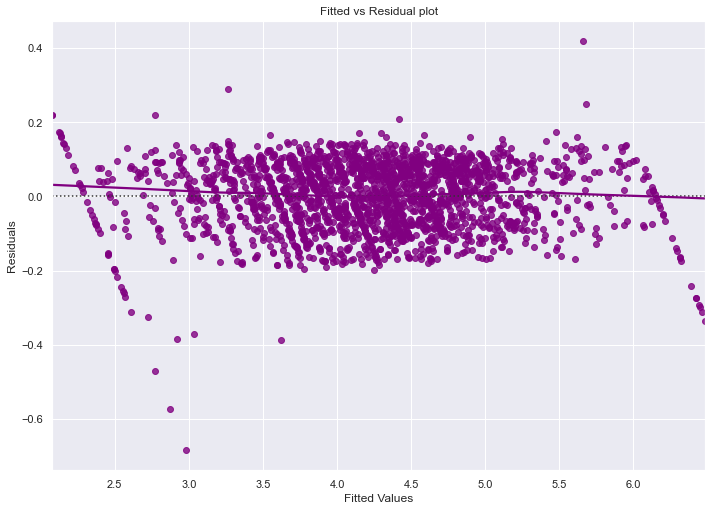

<IPython.core.display.Javascript object>

In [78]:
# let's plot the fitted values vs residuals

sns.residplot(
    data=df_pred, x="Fitted Values", y="Residuals", color="purple", lowess=True
)
plt.xlabel("Fitted Values")
plt.ylabel("Residuals")
plt.title("Fitted vs Residual plot")
plt.show()

<div class="alert alert-block alert-info"><b>Insight:</b> 
    
- The errors seem genrally consistant, except for the tail where they increase and there is that odd left/right line. This possibly suggests that there is a still optimazation that can be done.    
  
</div>

TEST FOR NORMALITY

Why the test?

    Error terms, or residuals, should be normally distributed. If the error terms are not normally distributed, confidence intervals of the coefficient estimates may become too wide or narrow. Once confidence interval becomes unstable, it leads to difficulty in estimating coefficients based on minimization of least squares. Non-normality suggests that there are a few unusual data points that must be studied closely to make a better model.

How to check normality?

    The shape of the histogram of residuals can give an initial idea about the normality.
    It can also be checked via a Q-Q plot of residuals. If the residuals follow a normal distribution, they will make a straight line plot, otherwise not.
    Other tests to check for normality includes the Shapiro-Wilk test.
        Null hypothesis: Residuals are normally distributed
        Alternate hypothesis: Residuals are not normally distributed

How to fix if this assumption is not followed?

    We can apply transformations like log, exponential, arcsinh, etc. as per our data.



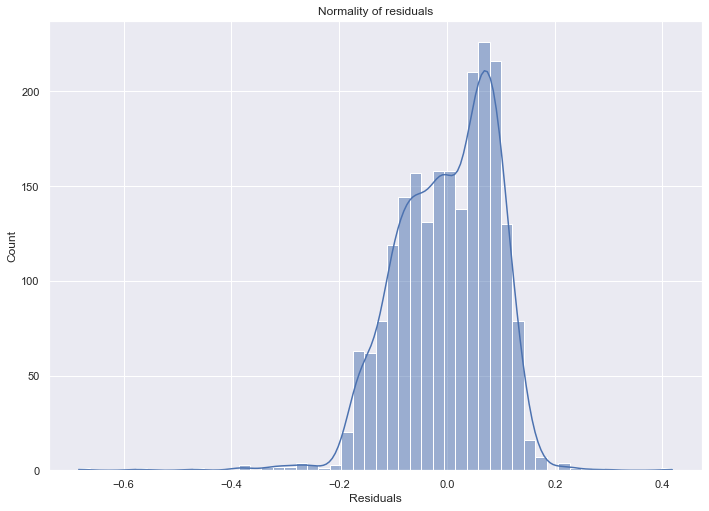

<IPython.core.display.Javascript object>

In [79]:
sns.histplot(data=df_pred, x="Residuals", kde=True)
plt.title("Normality of residuals")
plt.show()

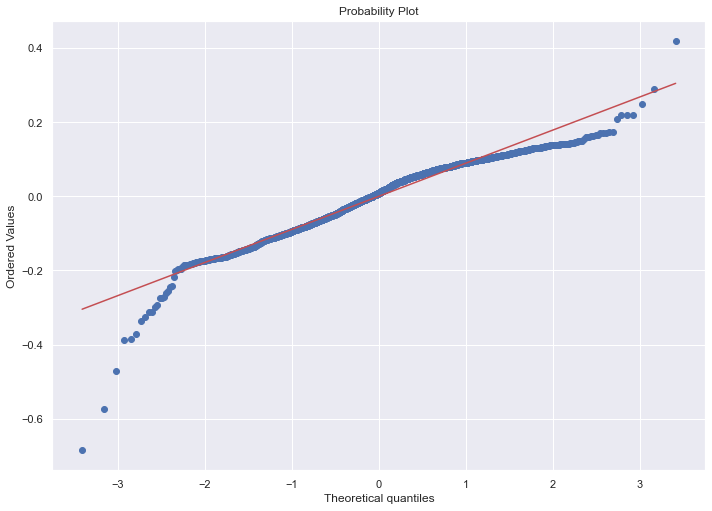

<IPython.core.display.Javascript object>

In [80]:
import pylab
import scipy.stats as stats

stats.probplot(df_pred["Residuals"], dist="norm", plot=pylab)
plt.show()

<div class="alert alert-block alert-info"><b>Insight:</b> 
    


The residuals more or less follow a straight line except for the tails.
Let's check the results of the Shapiro-Wilk test.



    
  
</div>

In [81]:
stats.shapiro(df_pred["Residuals"])

ShapiroResult(statistic=0.9583384990692139, pvalue=2.593337430209968e-24)

<IPython.core.display.Javascript object>

<div class="alert alert-block alert-info"><b>Insight:</b> 
    

- Since p-value < 0.05, the residuals are not normal as per the Shapiro-Wilk test.
Strictly speaking, the residuals are not normal.
However, as an approximation, we can accept this distribution as close to being normal.
                       
# So, the assumption is satisfied.

    
  
</div>

### TEST FOR HOMOSCEDASTICITY

    Homoscedascity: If the variance of the residuals is symmetrically distributed across the regression line, then the data is said to be homoscedastic.

    Heteroscedascity: If the variance is unequal for the residuals across the regression line, then the data is said to be heteroscedastic.

Why the test?

    The presence of non-constant variance in the error terms results in heteroscedasticity. Generally, non-constant variance arises in presence of outliers.

How to check for homoscedasticity?

    The residual vs fitted values plot can be looked at to check for homoscedasticity. In the case of heteroscedasticity, the residuals can form an arrow shape or any other non-symmetrical shape.
    The goldfeldquandt test can also be used. If we get a p-value > 0.05 we can say that the residuals are homoscedastic. Otherwise, they are heteroscedastic.
        Null hypothesis: Residuals are homoscedastic
        Alternate hypothesis: Residuals have heteroscedasticity

How to fix if this assumption is not followed?

    Heteroscedasticity can be fixed by adding other important features or making transformations.



In [82]:
import statsmodels.stats.api as sms
from statsmodels.compat import lzip

name = ["F statistic", "p-value"]
test = sms.het_goldfeldquandt(df_pred["Residuals"], x_train2)
lzip(name, test)

[('F statistic', 1.0169981039356226), ('p-value', 0.39192039307627247)]

<IPython.core.display.Javascript object>

<div class="alert alert-block alert-info"><b>Insight:</b> 
    
Since p-value > 0.05, we can say that the residuals are homoscedastic. So, this assumption is satisfied.

                     
# So, this assumption is satisfied.

# Now that we have checked all the assumptions of linear regression and they are satisfied, we can move towards the prediction part.
  
  
</div>

Now that we have checked all the assumptions of linear regression and they are satisfied, we can move towards the prediction part.

# predictions on the test set

In [83]:
# predictions on the test set
pred = olsmod2.predict(x_test2)

df_pred_test = pd.DataFrame({"Actual": y_test, "Predicted": pred})
df_pred_test.sample(10, random_state=1)

,Actual,Predicted
3343,5.059,5.123
2077,4.359,4.305
1996,3.988,4.132
313,4.194,4.079
427,3.481,3.409
1206,4.386,4.423
2285,4.788,4.787
281,5.343,5.240
1231,4.551,4.441
527,3.863,3.910


<IPython.core.display.Javascript object>

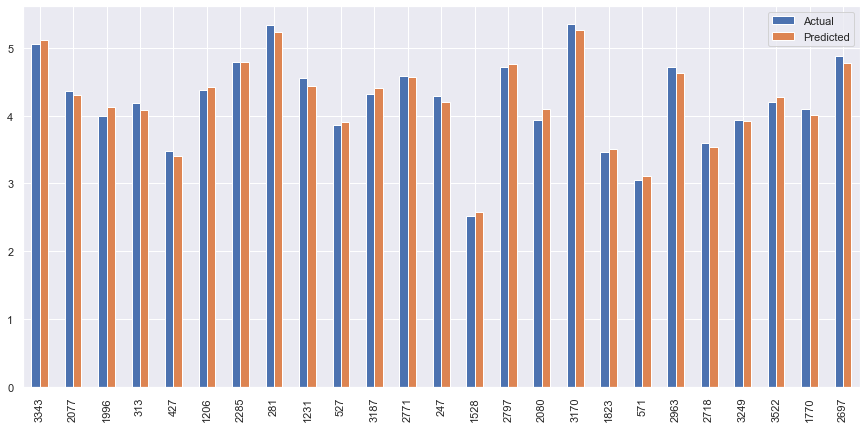

<IPython.core.display.Javascript object>

In [84]:
df1 = df_pred_test.sample(25, random_state=1)
df1.plot(kind="bar", figsize=(15, 7))
plt.show()

<div class="alert alert-block alert-info"><b>Insight:</b> 
    
    
  
</div>

In [85]:
# checking model performance on train set (seen 70% data)
print("Training Performance\n")
olsmod2_train_perf = model_performance_regression(olsmod2, x_train2, y_train)
olsmod2_train_perf

Training Performance



,RMSE,MAE,R-squared,Adj. R-squared,MAPE
0,0.091,0.074,0.985,0.985,1.859


<IPython.core.display.Javascript object>

In [86]:
# checking model performance on test set (seen 30% data)
print("Test Performance\n")
olsmod2_test_perf = model_performance_regression(olsmod2, x_test2, y_test)
olsmod2_test_perf

Test Performance



,RMSE,MAE,R-squared,Adj. R-squared,MAPE
0,0.097,0.078,0.984,0.984,1.921


<IPython.core.display.Javascript object>

<div class="alert alert-block alert-info"><b>Insight:</b> 
    
  

The model is able to explain ~98% of the variation in the data, which is very good.
The train and test RMSE and MAE are low and comparable. So, our model is not suffering from overfitting.
The MAPE on the test set suggests we can predict within 1.92% of the used price. 
Hence, we can conclude the model olsmod2 is good for prediction as well as inference purposes.

  
  
</div>



**Let's compare the initial model created with sklearn and the final statsmodels model.**

In [87]:
# training performance comparison

models_train_comp_df = pd.concat(
    [linearregression_train_perf.T, olsmod2_train_perf.T], axis=1,
)

models_train_comp_df.columns = [
    "Linear Regression sklearn",
    "Linear Regression statsmodels",
]

print("Training performance comparison:")
models_train_comp_df

Training performance comparison:


,Linear Regression sklearn,Linear Regression statsmodels
RMSE,0.091,0.091
MAE,0.074,0.074
R-squared,0.986,0.985
Adj. R-squared,0.985,0.985
MAPE,1.847,1.859


<IPython.core.display.Javascript object>

In [88]:
# test performance comparison

models_test_comp_df = pd.concat(
    [linearregression_test_perf.T, olsmod2_test_perf.T], axis=1,
)

models_test_comp_df.columns = [
    "Linear Regression sklearn",
    "Linear Regression statsmodels",
]

print("Test performance comparison:")
models_test_comp_df

Test performance comparison:


,Linear Regression sklearn,Linear Regression statsmodels
RMSE,0.097,0.097
MAE,0.078,0.078
R-squared,0.984,0.984
Adj. R-squared,0.983,0.984
MAPE,1.922,1.921


<IPython.core.display.Javascript object>

<div class="alert alert-block alert-info"><b>Insight:</b> 
    
The performance of the two models is close to each other.

Let's recreate the final statsmodels model and print it's summary to gain insights.  

 
  
  
</div>

In [89]:
olsmodel_final = sm.OLS(y_train, x_train2).fit()
print(olsmodel_final.summary())

                            OLS Regression Results                            
Dep. Variable:         used_price_log   R-squared:                       0.985
Model:                            OLS   Adj. R-squared:                  0.985
Method:                 Least Squares   F-statistic:                 1.312e+04
Date:                Thu, 21 Oct 2021   Prob (F-statistic):               0.00
Time:                        18:29:16   Log-Likelihood:                 2093.7
No. Observations:                2143   AIC:                            -4163.
Df Residuals:                    2131   BIC:                            -4095.
Df Model:                          11                                         
Covariance Type:            nonrobust                                         
                        coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------
const                -8.3329      3.45

<IPython.core.display.Javascript object>

<div class="alert alert-block alert-info"><b>Insight:</b> 
    
1. Screen Size, Selfie Camera MP, Release year all have positive impacts on used price.


2. Days Used as expected has a negative imnpact on Used Price


3. 5g/Gold Memory (is good) both take away from the price, as suggested before the market is not for the US or developed countries.


4. Brand Name works both ways (Celkon, Realme, and Sony are positive factors) and Gionee is negative impcat to used price. 
  
  
</div>

### Question 1 : What does the distribution of used phone prices look like? 

In [90]:
# Read in dataset
df = pd.read_csv("used_phone_data.csv")

<IPython.core.display.Javascript object>

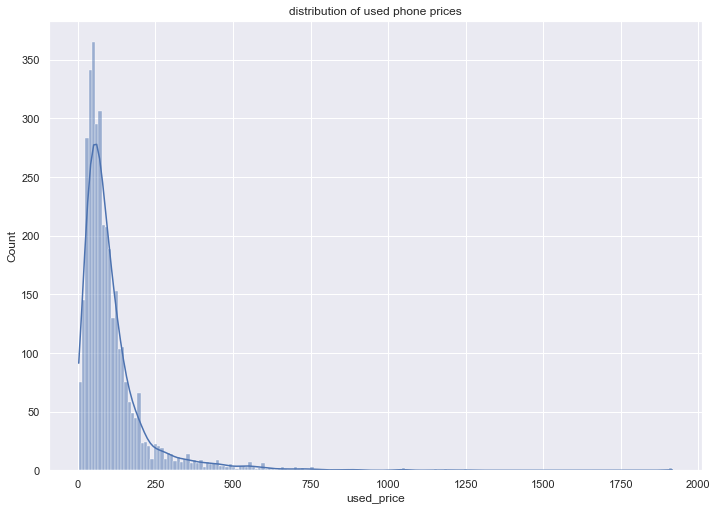

<IPython.core.display.Javascript object>

In [91]:
sns.histplot(data=df, x="used_price", kde=True)
plt.title("distribution of used phone prices")
plt.show()

<AxesSubplot:xlabel='used_price'>

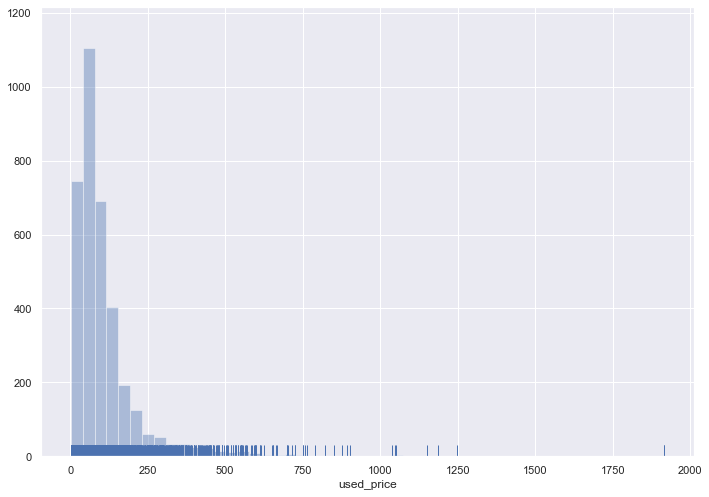

<IPython.core.display.Javascript object>

In [92]:
sns.distplot(df["used_price"], kde=False, rug=True)

<div class="alert alert-block alert-info"><b>Insight:</b> 
    
- The distrabution of used phone prices is right skewed, however the majority of phone prices are ~<$250 dollars.    
  
</div>

### Question 2 : What percentage of the used phone market is dominated by Android devices?

In [93]:
# function to create labeled barplots


def labeled_barplot(data, feature, perc=False, n=None):
    """
    Barplot with percentage at the top

    data: dataframe
    feature: dataframe column
    perc: whether to display percentages instead of count (default is False)
    n: displays the top n category levels (default is None, i.e., display all levels)
    """

    total = len(data[feature])  # length of the column
    count = data[feature].nunique()
    if n is None:
        plt.figure(figsize=(count + 1, 5))
    else:
        plt.figure(figsize=(n + 1, 5))

    plt.xticks(rotation=90, fontsize=15)
    ax = sns.countplot(
        data=data,
        x=feature,
        palette="Paired",
        order=data[feature].value_counts().index[:n].sort_values(),
    )

    for p in ax.patches:
        if perc == True:
            label = "{:.1f}%".format(
                100 * p.get_height() / total
            )  # percentage of each class of the category
        else:
            label = p.get_height()  # count of each level of the category

        x = p.get_x() + p.get_width() / 2  # width of the plot
        y = p.get_height()  # height of the plot

        ax.annotate(
            label,
            (x, y),
            ha="center",
            va="center",
            size=12,
            xytext=(0, 5),
            textcoords="offset points",
        )  # annotate the percentage

    plt.show()  # show the plot

<IPython.core.display.Javascript object>

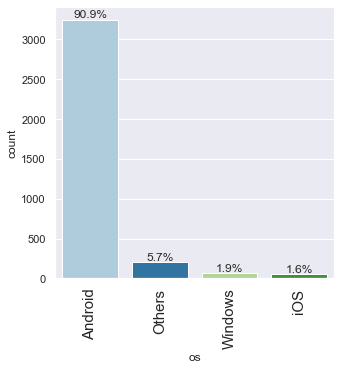

<IPython.core.display.Javascript object>

In [94]:
sns.set(rc={'figure.figsize':(11.7,8.27)})
labeled_barplot(df, "os", perc=True)


<div class="alert alert-block alert-info"><b>Insight:</b> 
    
~91% of all used phones are Android.    
  
</div>

### Question #3 The amount of RAM is important for the smooth functioning of a phone. How does the amount of RAM vary with the brand?

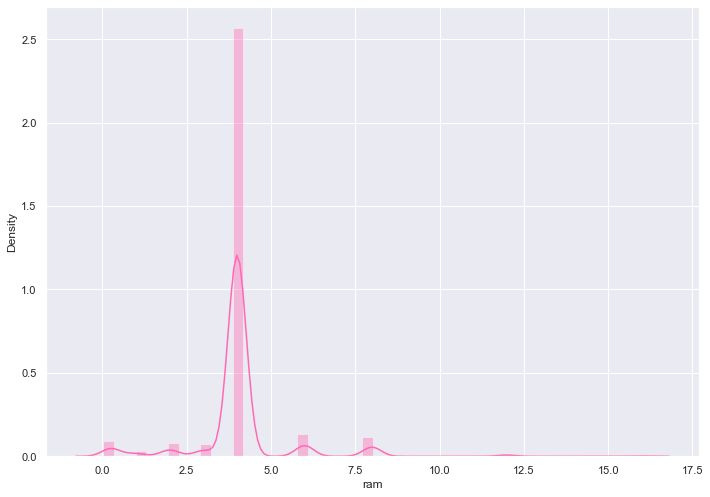

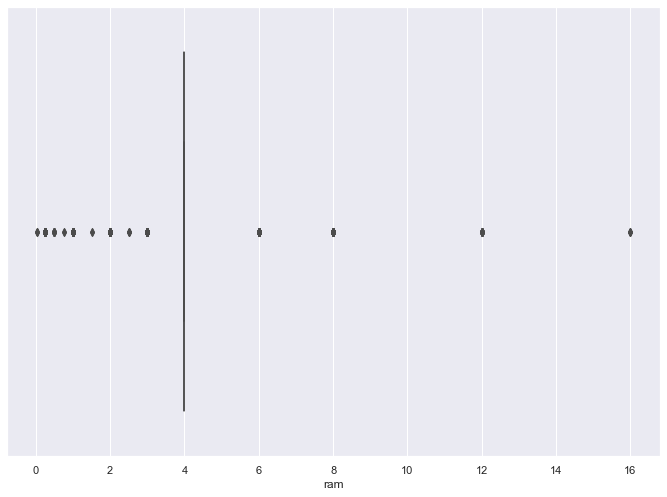

<IPython.core.display.Javascript object>

In [95]:
sns.distplot(df["ram"], color="hotpink")
plt.show()
sns.boxplot(df["ram"], orient="v")
plt.show()

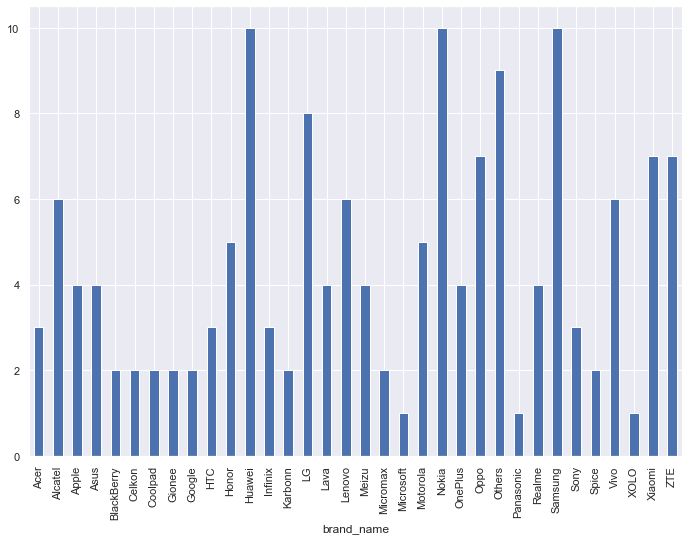

<IPython.core.display.Javascript object>

In [96]:
df.groupby("brand_name")["ram"].nunique().plot(kind="bar")
plt.show()

In [97]:
osbycount = pd.pivot_table(
    df, index=["brand_name",], values="ram", aggfunc={len, np.mean, np.min, np.max}
)
print(osbycount)

             amax  amin     len  mean
brand_name                           
Acer        4.000 1.000  51.000 3.902
Alcatel     4.000 0.250 125.000 3.426
Apple       6.000 2.000  59.000 4.000
Asus        8.000 2.000 126.000 4.048
BlackBerry  4.000 0.250  22.000 3.830
Celkon      4.000 0.250  37.000 1.466
Coolpad     4.000 3.000  22.000 3.955
Gionee      4.000 0.250  56.000 3.933
Google      6.000 4.000  15.000 4.533
HTC         6.000 3.000 110.000 4.000
Honor       8.000 2.000 118.000 4.593
Huawei     16.000 0.030 264.000 4.641
Infinix     4.000 2.000  10.000 2.600
Karbonn     4.000 0.250  30.000 3.375
LG          8.000 0.250 212.000 3.894
Lava        4.000 0.250  36.000 3.278
Lenovo      6.000 0.250 172.000 3.887
Meizu       8.000 2.000  62.000 4.452
Micromax    4.000 0.250 120.000 3.750
Microsoft   4.000 4.000  22.000 4.000
Motorola   12.000 2.000 110.000 3.945
Nokia      16.000 0.250 121.000 3.601
OnePlus    12.000 4.000  22.000 6.364
Oppo       12.000 1.000 129.000 4.961
Others      

<IPython.core.display.Javascript object>

In [98]:
# function to plot a boxplot and a histogram along the same scale.


def histogram_boxplot(data, feature, figsize=(12, 7), kde=False, bins=None):
    """
    Boxplot and histogram combined

    data: dataframe
    feature: dataframe column
    figsize: size of figure (default (12,7))
    kde: whether to the show density curve (default False)
    bins: number of bins for histogram (default None)
    """
    f2, (ax_box2, ax_hist2) = plt.subplots(
        nrows=2,  # Number of rows of the subplot grid= 2
        sharex=True,  # x-axis will be shared among all subplots
        gridspec_kw={"height_ratios": (0.25, 0.75)},
        figsize=figsize,
    )  # creating the 2 subplots
    sns.boxplot(
        data=data, x=feature, ax=ax_box2, showmeans=True, color="violet"
    )  # boxplot will be created and a star will indicate the mean value of the column
    sns.histplot(
        data=data, x=feature, kde=kde, ax=ax_hist2, bins=bins, palette="winter"
    ) if bins else sns.histplot(
        data=data, x=feature, kde=kde, ax=ax_hist2
    )  # For histogram
    ax_hist2.axvline(
        data[feature].mean(), color="green", linestyle="--"
    )  # Add mean to the histogram
    ax_hist2.axvline(
        data[feature].median(), color="black", linestyle="-"
    )  # Add median to the histogram

<IPython.core.display.Javascript object>

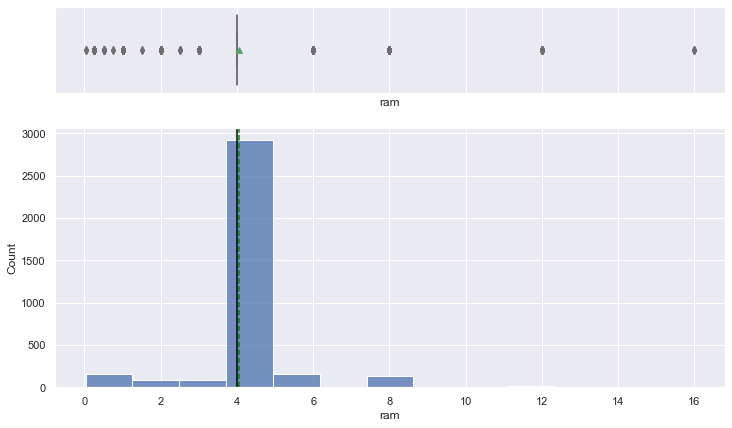

<IPython.core.display.Javascript object>

In [99]:
# Distrabution of All Ram across all phones.
histogram_boxplot(df, "ram")

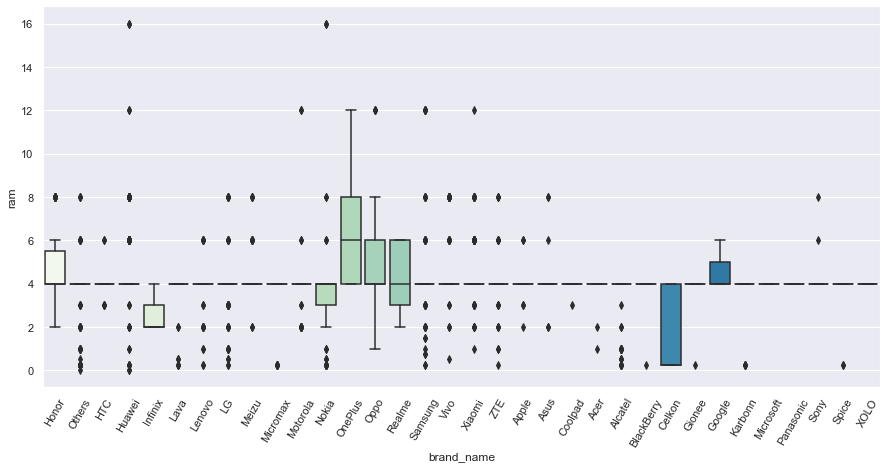

<IPython.core.display.Javascript object>

In [100]:
# Relationship between brand  and ram type
plt.figure(figsize=(15, 7))
sns.boxplot(x="brand_name", y="ram", data=df, palette="GnBu")
plt.xticks(rotation=60)
plt.show()

In [101]:
table1 = pd.pivot_table(df, index=["brand_name", "ram"], aggfunc={len, np.mean})
table1


battery          days_used         int_memory          \
                     len     mean       len    mean        len    mean   
brand_name ram                                                           
Acer       1.000   1.000 2700.000     1.000 578.000      1.000  16.000   
           2.000   1.000 2700.000     1.000 918.000      1.000  32.000   
           4.000  49.000 3011.837    49.000 797.878     49.000  23.184   
Alcatel    0.250   7.000 1360.000     7.000 811.571      7.000 278.857   
           0.500   3.000 3103.333     3.000 725.333      3.000  12.000   
...                  ...      ...       ...     ...        ...     ...   
ZTE        2.000   3.000 3000.000     3.000 496.333      3.000  21.333   
           3.000   3.000 3466.667     3.000 352.667      3.000  42.667   
           4.000 124.000 2776.411   124.000 772.202    124.000  37.419   
           6.000   5.000 4420.000     5.000 332.800      5.000 115.200   
           8.000   3.000 4866.667     3.000 234.667      3.000 170.667   

                 main_camera_mp        new_price         release_year  \
                            len   mean       len    mean          len   
brand_name ram                                                          
Acer       1.000          1.000  5.000     1.000 192.050        1.000   
           2.000          1.000  5.000     1.000 230.050        1.000   
           4.000         49.000  7.048    49.000 171.309       49.000   
Alcatel    0.250          7.000  1.821     7.000  59.837        7.000   
           0.500          3.000  0.867     3.000  77.013        3.000   
...                         ...    ...       ...     ...          ...   
ZTE        2.000          3.000 14.000     3.000 103.787        3.000   
           3.000          3.000 15.000     3.000 113.017        3.000   
           4.000        124.000 11.068   124.000 205.505      124.000   
           6.000          5.000 25.667     5.000 468.668        5.000   
           8.000          3.000 48.000     3.000 636.793        3.000   

                          screen_size        selfie_camera_mp         \
                     mean         len   mean              len   mean   
brand_name ram                                                         
Acer       1.000 2014.000       1.000 25.560            1.000  2.000   
           2.000 2014.000       1.000 25.560            1.000  2.000   
           4.000 2014.388      49.000 14.824           49.000  2.494   
Alcatel    0.250 2013.714       7.000  7.641            7.000  0.300   
           0.500 2015.667       3.000 14.607            3.000  1.867   
...                   ...         ...    ...              ...    ...   
ZTE        2.000 2018.667       3.000 18.360            3.000  7.000   
           3.000 2019.000       3.000 15.877            3.000  9.667   
           4.000 2015.500     124.000 13.213          124.000  5.819   
           6.000 2019.400       5.000 23.686            5.000 15.200   
           8.000 2019.667       3.000 25.560            3.000 12.000   

                 used_price          weight          
                        len    mean     len    mean  
brand_name ram                                       
Acer       1.000      1.000  96.190   1.000 508.000  
           2.000      1.000  68.980   1.000 508.000  
           4.000     49.000  63.032  49.000 214.357  
Alcatel    0.250      7.000  19.624   7.000 101.129  
           0.500      3.000  31.447   3.000 233.333  
...                     ...     ...     ...     ...  
ZTE        2.000      3.000  51.903   3.000 146.000  
           3.000      3.000  73.227   3.000 163.333  
           4.000    124.000  79.592 124.000 154.192  
           6.000      5.000 301.092   5.000 190.800  
           8.000      3.000 450.427   3.000 216.000  

[151 rows x 20 columns]

<IPython.core.display.Javascript object>

<div class="alert alert-block alert-info"><b>Insight:</b> 
    
- 82% of the used phones have 4mb of ram    
  
</div>

### Question #4 - A large battery often increases a phone's weight, making it feel uncomfortable in the hands. How does the weight vary for phones offering large batteries (more than 4500 mAh)?

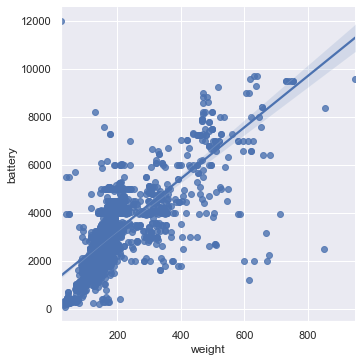

<IPython.core.display.Javascript object>

In [102]:
sns.lmplot(y="battery", x="weight", data=df)

In [103]:
# Query the database for more than 4500 mAh
df_g = df.query("battery > 4500")

# Filter out labels of interest
# df_g = df_g.filter(["brand_name", "weight"])

df_g.describe().T

# Group the value according to a condition
# df_g.groupby('brand_name', 'weight').mean()

,count,mean,std,min,25%,50%,75%,max
screen_size,346.000,21.487,5.170,10.160,16.350,20.960,25.560,46.360
main_camera_mp,292.000,9.186,4.900,0.300,5.000,8.000,13.000,48.000
selfie_camera_mp,346.000,7.206,6.254,0.300,2.000,5.000,8.000,32.000
int_memory,346.000,59.145,86.464,16.000,16.000,32.000,64.000,1024.000
ram,346.000,4.246,1.467,1.000,4.000,4.000,4.000,12.000
battery,346.000,5884.103,1327.656,4520.000,5000.000,5100.000,6690.000,12000.000
weight,346.000,330.719,160.953,23.000,198.000,299.000,467.000,950.000
release_year,346.000,2017.113,2.456,2013.000,2015.000,2017.500,2019.000,2020.000
days_used,346.000,568.760,278.010,92.000,319.250,581.500,778.750,1089.000
new_price,346.000,307.462,200.482,80.820,180.143,250.265,351.098,1200.850


<IPython.core.display.Javascript object>

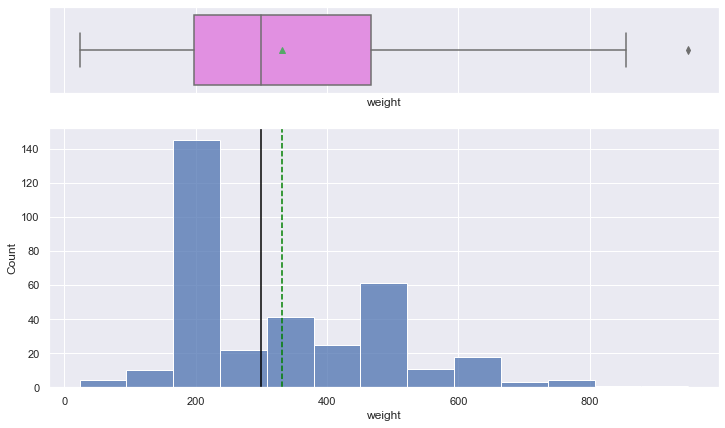

<IPython.core.display.Javascript object>

In [104]:
histogram_boxplot(df_g, "weight")

<div class="alert alert-block alert-info"><b>Insight:</b> 
    
- The overall realtionship , as the battery mAH increase,  so does the weight of the phone.
- There are 346 phones that have batteries >  than 4500 mAh   
- For phones offering large batteries >  than 4500 mAh ... as measured in grams
    
    - mean is 330.72
    - min is 23    
    - 25% is 198
    - 50% is 299
    - 75% is 467
    - Max is 950    
  
</div>

### Question #5 - Bigger screens are desirable for entertainment purposes as they offer a better viewing experience. How many phones are available across different brands with a screen size larger than 6 inches?

In [111]:
# taking input
num = float(input("Enter the distance measured in centimeter : "))

# converting from cms to inches
""" 1 inch = 2.54 centimeters"""
inc = num / 2.54

# printing the result
print("Distance in inch : ", inc)

Enter the distance measured in centimeter : 15.24
Distance in inch :  6.0


<IPython.core.display.Javascript object>

In [105]:


# Query the database for screen sizes > 6 inches (15.24 centimeters)
df_ss = df.query("screen_size > 15.24")

<IPython.core.display.Javascript object>

In [106]:
df_ss.describe().T

,count,mean,std,min,25%,50%,75%,max
screen_size,1235.000,20.384,4.220,15.400,16.190,19.840,23.970,46.360
main_camera_mp,1062.000,9.430,4.812,0.300,5.000,10.500,13.000,48.000
selfie_camera_mp,1234.000,10.812,8.969,0.300,2.200,8.000,16.000,32.000
int_memory,1235.000,80.094,90.459,0.200,32.000,64.000,128.000,1024.000
ram,1235.000,4.518,1.833,0.250,4.000,4.000,4.000,12.000
battery,1233.000,4245.503,1306.243,1200.000,3500.000,4000.000,4500.000,12000.000
weight,1235.000,244.604,123.042,23.000,171.000,192.000,291.000,950.000
release_year,1235.000,2017.672,2.324,2013.000,2016.000,2019.000,2019.000,2020.000
days_used,1235.000,493.794,250.634,91.000,285.500,452.000,667.500,1090.000
new_price,1235.000,310.519,256.334,40.080,150.825,241.810,381.504,2560.200


<IPython.core.display.Javascript object>

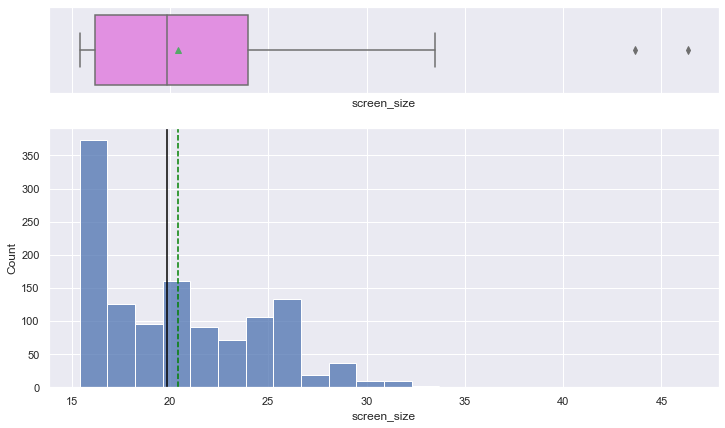

<IPython.core.display.Javascript object>

In [107]:
histogram_boxplot(df_ss, "screen_size")

<div class="alert alert-block alert-info"><b>Insight:</b> 
    
There are 1235 phones with a screen size > 6 inches (15.24 cm)
- mean 20.38
- min 15.40
- 25% 16.19
- 50% 19.84
- 75% 23.97
- Max 46.36
  
</div>

### Question #6 - Budget phones nowadays offer great selfie cameras, allowing us to capture our favorite moments with loved ones. What is the distribution of budget phones offering greater than 8MP selfie cameras across brands?

In [108]:
# Query the database for budget phones offering greater than 8MP
df_sc = df.query("selfie_camera_mp > 8")

df_sc.describe().T

,count,mean,std,min,25%,50%,75%,max
screen_size,666.000,18.334,4.593,2.700,15.560,16.110,22.030,32.390
main_camera_mp,545.000,12.138,4.410,0.300,10.500,13.000,13.000,48.000
selfie_camera_mp,666.000,18.680,6.312,9.000,16.000,16.000,20.000,32.000
int_memory,666.000,108.240,83.033,4.000,64.000,128.000,128.000,1024.000
ram,666.000,5.266,2.089,0.030,4.000,4.000,6.000,16.000
battery,666.000,3828.559,776.013,230.000,3400.000,4000.000,4200.000,6000.000
weight,666.000,180.390,28.711,25.000,165.550,181.000,196.375,300.000
release_year,666.000,2018.631,1.234,2013.000,2018.000,2019.000,2019.000,2020.000
days_used,666.000,424.200,206.416,91.000,264.000,385.500,545.250,1091.000
new_price,666.000,387.318,291.621,99.700,218.923,299.340,459.870,2560.200


<IPython.core.display.Javascript object>

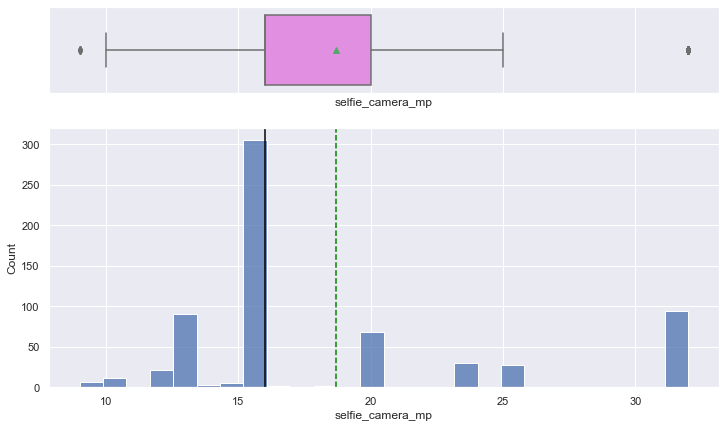

<IPython.core.display.Javascript object>

In [109]:
histogram_boxplot(df_sc, "selfie_camera_mp")

<div class="alert alert-block alert-info"><b>Insight:</b> 
    
There are 666 phones with selfie camera > 8MP
- mean 18.68
- min 9.00
- 25% 16.00
- 50% 16.00
- 75% 20.00
- max 32.00    
  
</div>

### Question #7 - Which attributes are highly correlated with the used phone price?


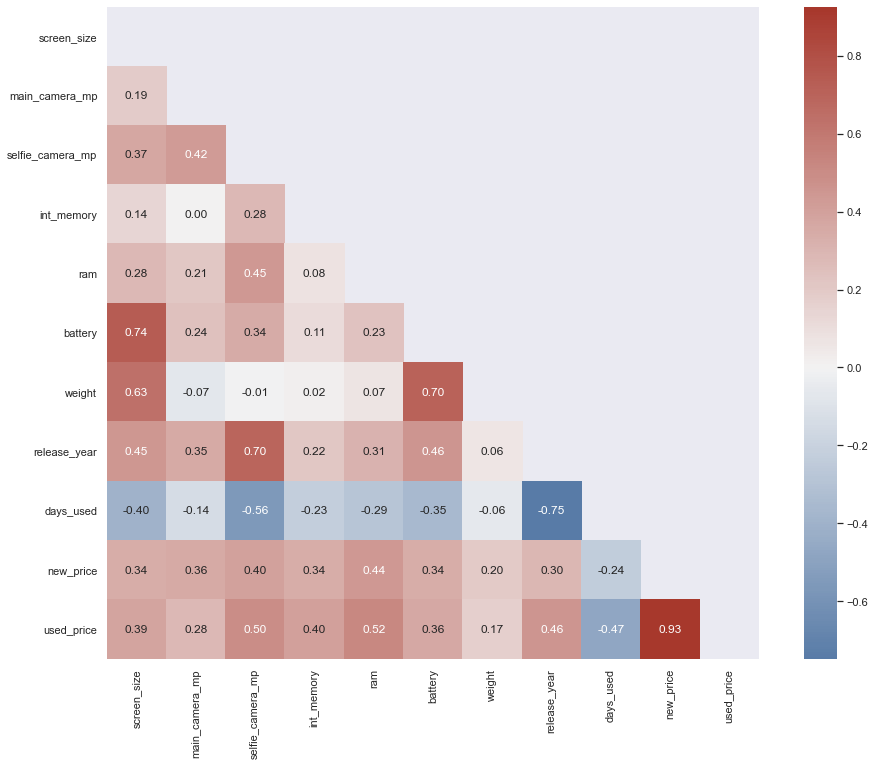

<IPython.core.display.Javascript object>

In [110]:
# Calculate pairwise-correlation
matrix = df.corr()

# Create a mask
mask = np.triu(np.ones_like(matrix, dtype=bool))

# Create a custom diverging palette
cmap = sns.diverging_palette(250, 15, s=75, l=40, n=9, center="light", as_cmap=True)

plt.figure(figsize=(16, 12))

sns.heatmap(matrix, mask=mask, center=0, annot=True, fmt=".2f", square=True, cmap=cmap)

plt.show()

<div class="alert alert-block alert-info"><b>Insight:</b> 
    
There are 666 phones with selfie camera > 8MP
- mean 18.68
- min 9.00
- 25% 16.00
- 50% 16.00
- 75% 20.00
- max 32.00    
  
</div>